---
# Esercitazione 11
---
In questa esercitazione verranno create e utilizzate reti neurali per effettuare fit di diversi dati.

## 11.1 - Regressione lineare con reti neurali
Lo scopo di questo primo punto è impratichirsi con le NN (Neural Networks) utilizzando un fit di dati lineari, a partire dall'esempio fornito a lezione: $f(x) = 2x+1$. Per un fit lineare esistono due parametri: coefficiente angolare ed intercetta. Per questo motivo è necessario un solo neurone per eseguire il fit, in quanto il valore di output è generato da $w \cdot \text{input} + b$. <br>
Verrà messa attenzione sull'impatto nel modello del numero di epoche $N_{epochs}$ (di default $30$), del numero di dati di addestramento $N_{train}$ (di default $500$), del rumore $\sigma$ (di default $0$) e del numero di dati di validazione $N_{valid}$ (di default $50$), cercando di migliorare il modello fornito di rete neurale sequenziale. Come Loss function viene utilizzato l'errore quadratico medio tra i valori veri di $f(x)$ (calcolati con $m=2$ e $q=1$) e i valori previsti usando i dati di validazione.

Di seguito vengono mostrati i risultati ottenuti al variare del rumore, utilizzando i seguenti valori: $\sigma = 0, 0.1, 0.2, 0.3$. A partire dai valori veri della funzione lineare vengono generati $4$ dataset (sia di training che di validazione) diffusi con distribuzione gaussiana con queste deviazioni standard, ovvero ognuno di esse presenta un rumore gaussiano crescente.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# compose the NN model
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras import backend as K
from tensorflow.keras.utils import get_custom_objects

# generate training inputs
np.random.seed(0)

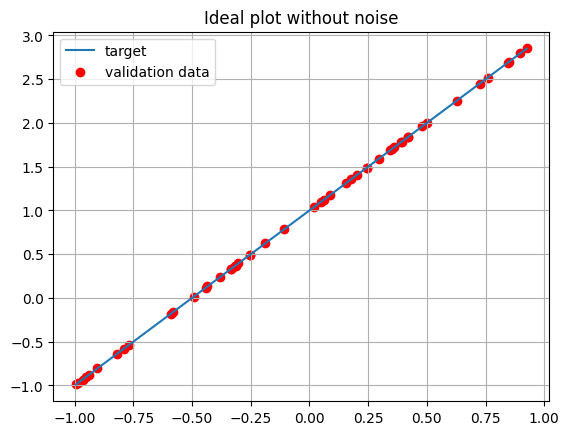

In [2]:
# target parameters of f(x) = m*x + b
m = 2 # slope
b = 1 # intersect

x_train = np.random.uniform(-1, 1, 500) # 500 valori di input per l'addestramento
x_valid = np.random.uniform(-1, 1, 50)  # 50 valori input per la validazione
x_valid.sort()                          # l'ingresso x dev'essere ordinato per plottarlo
y_target = m * x_valid + b              # distribuzione target ideale, serve solo per il confronto grafico

# genero diversi dati di addestramento al variare del rumore (diverse misure)
sigma = [0.1*i for i in range(4)]       # lista diverse deviazioni std
y_train = [np.random.normal(m * x_train + b, s) for s in sigma] # lista di diversi dati di training (misure con errore diverso)
y_valid = [np.random.normal(m * x_valid + b, s) for s in sigma] # lista di diversi dati di validazione da usare per ogni errore

# plot validation and target dataset
plt.plot(x_valid, y_target, label='target')
plt.title("Ideal plot without noise")
plt.scatter(x_valid, y_valid[0], color='r', label='validation data')
plt.legend()
plt.grid(True)
plt.show()

In [3]:
# creo un modello per ogni errore
model = [tf.keras.Sequential() for _ in sigma]
# creo una rete a un neurone per ogni errore
for i in range(len(sigma)):
    model[i].add(Dense(1, input_shape=(1,)))
    model[i].compile(optimizer='sgd', loss='mse', metrics=['mse'])

c:\Users\teote\Desktop\uni\2023-2024\Lab_Simulazione_Numerica\venv_dir\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [4]:
# get a summary of our composed model
# model.summary()

# fit the model using training dataset over 30 epochs of 32 batch size each
# report training progress against validation data
history = [
    model[i].fit(
        x=x_train, y=y_train[i], # per ogni dataset con errore diverso creo il modello
        batch_size=32, epochs=30, 
        shuffle=True, # a good idea is to shuffle input before at each epoch to avoid overfitting
        validation_data=(x_valid, y_valid[i]))
    for i in range(len(sigma))
]

# salvo tutti i pesi dei 4 modelli
weights = []
# return weights and biases
for i in range(len(sigma)):
    weights.append(model[i].get_weights())

# Salvo i singoli valori
m_fits = []
q_fits = []
for i in range(len(sigma)):
    m_fits.append(weights[i][0][0][0])
    q_fits.append(weights[i][1][0])

# evaluate model: valuto la bontà dei risultati
score = [model[i].evaluate(x_valid, y_valid[i], batch_size=32, verbose=0) for i in range(len(sigma))] # verbose=1 stampa i dettagli dell'addestramento

# print performance
for i in range(len(sigma)):
    print(f"Performances of NN {i}")
    print(f"Model {i} m: {m_fits[i]:.3}, q: {q_fits[i]:.3}")
    print(f'Test loss, valid: {score[i][0]:.3f}') # per ogni dataset, score[0] è il valore di test loss (qui MSE)
    print(f'Test accuracy, valid: {score[i][1]:.3f}') # per ogni dataset, score[1] è il test accuracy


Epoch 1/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 4.9495 - mse: 4.9495 - val_loss: 3.7133 - val_mse: 3.7133
Epoch 2/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.9944 - mse: 3.9944 - val_loss: 2.8815 - val_mse: 2.8815
Epoch 3/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9286 - mse: 2.9286 - val_loss: 2.2684 - val_mse: 2.2684
Epoch 4/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2964 - mse: 2.2964 - val_loss: 1.7969 - val_mse: 1.7969
Epoch 5/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.8734 - mse: 1.8734 - val_loss: 1.4339 - val_mse: 1.4339
Epoch 6/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5464 - mse: 1.5464 - val_loss: 1.1469 - val_mse: 1.1469
Epoch 7/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.2003 - mse: 1.2003 - val_loss: 0.9191 - val_mse: 0.9191
Epoch 8/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.9360 - mse: 0.9360 - val_loss: 0.7378 - val_mse: 0.7378
Epoch 9/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7337 - mse:

C:\Users\teote\AppData\Local\Temp\ipykernel_12596\1486883671.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = cm.get_cmap('viridis', len(sigma))


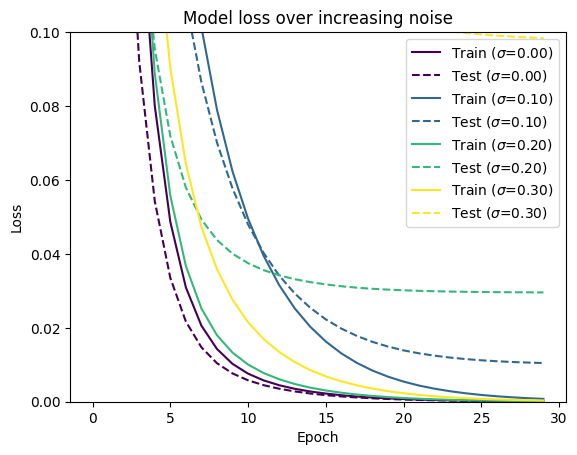

In [5]:
import matplotlib.cm as cm

color_map = cm.get_cmap('viridis', len(sigma))

# Genera una sequenza di colori
colors = list(color_map(np.linspace(0, 1, len(sigma))))

# look into training history
# Plot training & validation loss values
for i in range(len(sigma)):
    plt.plot(history[i].history['loss'], label=f'Train ($\sigma$={sigma[i]:.2f})', color=colors[i])
    plt.plot(history[i].history['val_loss'], label=f'Test ($\sigma$={sigma[i]:.2f})', color=colors[i], linestyle='dashed')
    
plt.title('Model loss over increasing noise')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='best')

plt.ylim(0, 0.1)
plt.show()

Dai risultati ottenuti si evince che, come prevedibile, il risultato più consistente è quello in cui il rumore sui dati è nullo. In questo caso si nota che l'errore sui dati di test risulta inferiore a quello sui dati di training, mentre negli altri avviene il contrario.

Come aspettato, si può anche notare che all'aumentare del numero di epoche tutti gli errori si riducono. Per verificare la monotonia decrescente vengono qui riportati i risultati precedenti, incrementando il numero di epoche a $N_{epochs}=100$. Prima di fare ciò viene mostrato il confronto tra i risultati delle previsioni di due modelli, quello con $\sigma=0$ e quello con $\sigma=0.3$. Tale confronto è dunque quello tra i due modelli che hanno causato un valore di perdita rispettivamente minore e maggiore tra tutti e quattro i modelli.

4/4 [==============================] - 0s 3ms/step


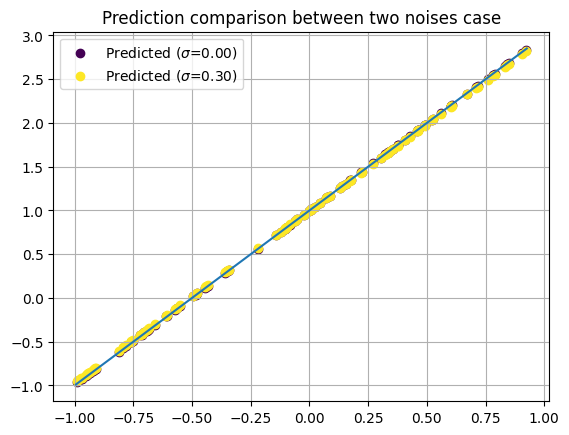

In [16]:
x_predicted = np.random.uniform(-1, 1, 100)
y_predicted = [model[i].predict(x_predicted) for i in range(len(sigma))]

# for i in range(len(sigma)):
plt.scatter(x_predicted, y_predicted[0],color=colors[0], label=f'Predicted ($\sigma$={sigma[0]:.2f})')
plt.scatter(x_predicted, y_predicted[-1],color=colors[-1], label=f'Predicted ($\sigma$={sigma[-1]:.2f})')

plt.title('Prediction comparison between two noises case')
plt.legend(loc='best')
plt.plot(x_valid, y_target)
plt.grid(True)
plt.show()

Si può notare che nonostante il valore di loss nei dati di validazione nel caso $\sigma=0.3$ sia circa $30$ volte maggiore di quello ottenuto su dati a $\sigma=0$, l'andamento lineare viene predetto discretamente anche nel primo caso.

Di seguito vengono riportati li stessi risultati ma incrementando il numero di epoche.

Epoch 1/100
16/16 [==============================] - 1s 19ms/step - loss: 0.9593 - mse: 0.9593 - val_loss: 0.6455 - val_mse: 0.6455
Epoch 2/100
16/16 [==============================] - 0s 9ms/step - loss: 0.5629 - mse: 0.5629 - val_loss: 0.3810 - val_mse: 0.3810
Epoch 3/100
16/16 [==============================] - 0s 5ms/step - loss: 0.3428 - mse: 0.3428 - val_loss: 0.2360 - val_mse: 0.2360
Epoch 4/100
16/16 [==============================] - 0s 4ms/step - loss: 0.2184 - mse: 0.2184 - val_loss: 0.1527 - val_mse: 0.1527
Epoch 5/100
16/16 [==============================] - 0s 5ms/step - loss: 0.1452 - mse: 0.1452 - val_loss: 0.1042 - val_mse: 0.1042
Epoch 6/100
16/16 [==============================] - 0s 7ms/step - loss: 0.1011 - mse: 0.1011 - val_loss: 0.0742 - val_mse: 0.0742
Epoch 7/100
16/16 [==============================] - 0s 7ms/step - loss: 0.0731 - mse: 0.0731 - val_loss: 0.0552 - val_mse: 0.0552
Epoch 8/100
16/16 [==============================] - 0s 6ms/step - loss: 0.0548 - 

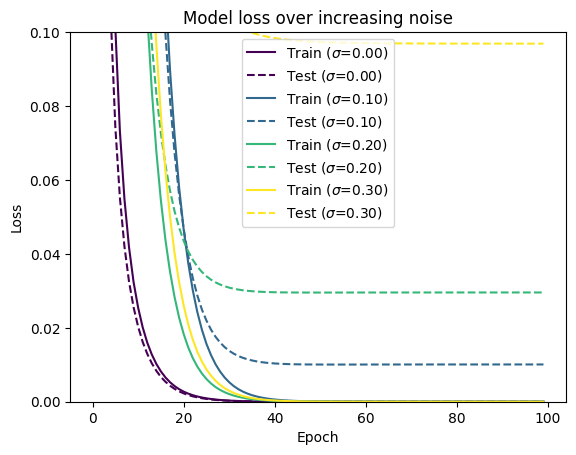

In [17]:
# creo un modello per ogni errore nel caso di 100 epoche
model_e100 = [tf.keras.Sequential() for _ in sigma]
# creo una rete a un neurone per ogni errore
for i in range(len(sigma)):
    model_e100[i].add(Dense(1, input_shape=(1,)))
    model_e100[i].compile(optimizer='sgd', loss='mse', metrics=['mse'])

history_e100 = [
    model_e100[i].fit(
        x=x_train, y=y_train,
        batch_size=32, epochs=100, 
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid, y_valid[i]))
    for i in range(len(sigma))
]

# return weights and biases
for i in range(len(sigma)):
    print(f"Model 100 epochs {i} weight:")
    model_e100[i].get_weights()

# evaluate model
score_e100 = [model_e100[i].evaluate(x_valid, y_valid[i], batch_size=32, verbose=0) for i in range(len(sigma))] # verbose=1 stampa i dettagli dell'addestramento

# print performance
for i in range(len(sigma)):
    print(f"Performances of NN {i} with 100 epochs")
    print('Test loss, valid:', score_e100[i][0])
    print('Test accuracy, valid:', score_e100[i][1])


# look into training history
# Plot training & validation loss values
for i in range(len(sigma)):
    plt.plot(history_e100[i].history['loss'], label=f'Train ($\sigma$={sigma[i]:.2f})', color=colors[i])
    plt.plot(history_e100[i].history['val_loss'], label=f'Test ($\sigma$={sigma[i]:.2f})', color=colors[i], linestyle='dashed')
    
plt.title('Model loss over increasing noise')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='best')

plt.ylim(0, 0.1)
plt.show()


Da quanto riportato si evince che gli errori sui dati di validazione (test) convergono a un valore asinotico sempre maggiore di quello dei dati di allenamento (train). Si osserva inoltre che la velocità di convergenza è aumentata rispetto al caso senza errore, tuttavia non vi è una chiara dipendenza dalla deviazione standard. Infatti, il dataset più lento è quello con $\sigma=0.3$, ma il secondo più lento sembra essere $\sigma=0.1$.

Di seguito vengono riportati i risultati al variare del numero di dati di training, fissando il rumore a $\sigma=0$ e $N_{epochs}=100$. Vengono utilizzati i seguenti valori: $N_{train}=250, 500, 750, 1000$. Il modello base fornito utilizza ($N_{train}=500$).

In [19]:
# definisco i diversi numeri di dati di training in una lista esterna così che sia modificabile
N_train = [250+i*250 for i in range(4)]
x_train_2 = [np.random.uniform(-1, 1, n_t) for n_t in N_train] # lista con i diversi valori di input al variare del numero di dati di addestramento
# per i dati di validazione x lascio li stessi di prima
# anche i dati target sono uguali a prima

# genero i diversi dati di addestramento
sigma_2 = 0       # devizione std (rumore)
y_train_2 = [np.random.normal(m * x_train_2[i] + b, sigma_2) for i in range(len(N_train))] # lista di diversi dati di training (misure con errore diverso)
y_valid_2 = np.random.normal(m * x_valid + b, sigma_2) # lista di diversi dati di validazione da usare per ogni errore



In [20]:

# creo un modello per ogni set di dati di addestramento
model_2 = [tf.keras.Sequential() for _ in N_train]

# creo una rete a un neurone per ogni dataset di addestramento
for i in range(len(N_train)):
    model_2[i].add(Dense(1, input_shape=(1,)))
    model_2[i].compile(optimizer='sgd', loss='mse', metrics=['mse'])

history_2 = [
    model_2[i].fit(
        x=x_train_2[i], y=y_train_2[i],
        batch_size=32, epochs=100, 
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid, y_valid_2))
    for i in range(len(N_train))
]

# return weights and biases
for n in range(len(N_train)):
    print(f"Weight for model with {N_train[i]} training data:")
    model_2[i].get_weights()

# evaluate model
score_2 = [model_2[i].evaluate(x_valid, y_valid_2, batch_size=32, verbose=0) for i in range(len(N_train))] # verbose=1 stampa i dettagli dell'addestramento

# print performance
for i in range(len(N_train)):
    print(f"Performances of NN with {N_train[i]} training data")
    print('Test loss, valid:', score_2[i][0])
    print('Test accuracy, valid:', score_2[i][1])

Epoch 1/100
8/8 [==============================] - 1s 32ms/step - loss: 1.5114 - mse: 1.5114 - val_loss: 1.3526 - val_mse: 1.3526
Epoch 2/100
8/8 [==============================] - 0s 8ms/step - loss: 1.2464 - mse: 1.2464 - val_loss: 1.1213 - val_mse: 1.1213
Epoch 3/100
8/8 [==============================] - 0s 9ms/step - loss: 1.0382 - mse: 1.0382 - val_loss: 0.9406 - val_mse: 0.9406
Epoch 4/100
8/8 [==============================] - 0s 8ms/step - loss: 0.8745 - mse: 0.8745 - val_loss: 0.7979 - val_mse: 0.7979
Epoch 5/100
8/8 [==============================] - 0s 8ms/step - loss: 0.7459 - mse: 0.7459 - val_loss: 0.6852 - val_mse: 0.6852
Epoch 6/100
8/8 [==============================] - 0s 8ms/step - loss: 0.6425 - mse: 0.6425 - val_loss: 0.5913 - val_mse: 0.5913
Epoch 7/100
8/8 [==============================] - 0s 8ms/step - loss: 0.5568 - mse: 0.5568 - val_loss: 0.5154 - val_mse: 0.5154
Epoch 8/100
8/8 [==============================] - 0s 11ms/step - loss: 0.4862 - mse: 0.4862 - v

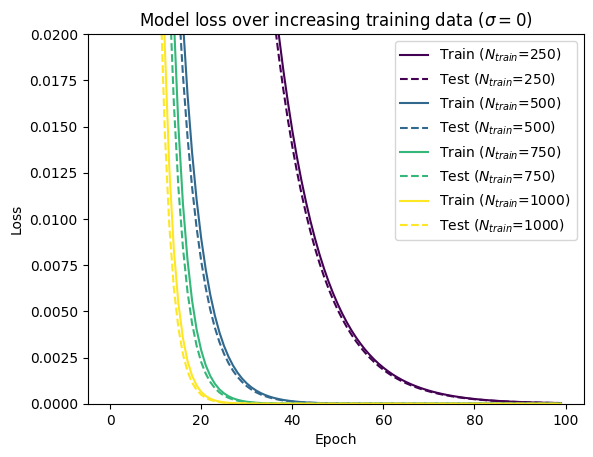

In [23]:
# look into training history
# Plot training & validation loss values
for i in range(len(N_train)):
    plt.plot(history_2[i].history['loss'], label=f'Train ($N_{{train}}$={N_train[i]})', color=colors[i])
    plt.plot(history_2[i].history['val_loss'], label=f'Test ($N_{{train}}$={N_train[i]})', color=colors[i], linestyle='dashed')
    
plt.title('Model loss over increasing training data ($\sigma=0$)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='best')

plt.ylim(0, 0.02)
plt.show()

Dai grafici riportati risulta che all'aumentare del numero di dati di training la velocità di convergenza aumenta (sempre in termini di numero di epoche). Per $250$ dati di addestramento la curva di errore si appiattisce dopo circa $80$ epoche, per $500$ dati dopo $40$, per $750$ dopo $30$ e per $1000$ dopo $20$. Notiamo dunque che la decrescita è più lenta di una semplice proporzionalità inversa.
Una considerazione importante da fare però, è che ovviamente all'aumentare del numero di dati di training il tempo di addestramento aumenta.
Globalmente, questo risultato indica che per un numero fissato di epoche non è conveniente utilizzare un valore troppo elevato di dati di addestramento.

Di seguito vengono mostrati i risultati della stessa analisi ma a partire da dati con rumore ($\sigma=0.3$).

In [24]:
# per i valori di x di training lascio li stessi di prima
# per i dati di validazione x lascio li stessi di prima
# anche i dati target sono uguali a prima

# genero i diversi dati di addestramento
sigma_3 = 0.3       # devizione std (rumore)
y_train_3 = [np.random.normal(m * x_train_2[i] + b, sigma_3) for i in range(len(N_train))] # lista di diversi dati di training (misure con errore diverso)
y_valid_3 = np.random.normal(m * x_valid + b, sigma_3) # lista di diversi dati di validazione da usare per ogni errore


In [29]:
# creo un modello per ogni set di dati di addestramento
model_3 = [tf.keras.Sequential() for _ in N_train]

# creo una rete a un neurone per ogni dataset di addestramento
for i in range(len(N_train)):
    model_3[i].add(Dense(1, input_shape=(1,)))
    model_3[i].compile(optimizer='sgd', loss='mse', metrics=['mse'])

history_3 = [
    model_3[i].fit(
        x=x_train_2[i], y=y_train_3[i],
        batch_size=32, epochs=100, 
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid, y_valid_3))
    for i in range(len(N_train))
]

# return weights and biases
for n in range(len(N_train)):
    print(f"Weight for model with {N_train[i]} training data:")
    model_3[i].get_weights()

# evaluate model
score_3 = [model_3[i].evaluate(x_valid, y_valid_3, batch_size=32, verbose=0) for i in range(len(N_train))] # verbose=1 stampa i dettagli dell'addestramento

# print performance
for i in range(len(N_train)):
    print(f"Performances of NN with {N_train[i]} training data")
    print('Test loss, valid:', score_3[i][0])
    print('Test accuracy, valid:', score_3[i][1])

Epoch 1/100
8/8 [==============================] - 1s 29ms/step - loss: 2.5147 - mse: 2.5147 - val_loss: 2.7083 - val_mse: 2.7083
Epoch 2/100
8/8 [==============================] - 0s 8ms/step - loss: 2.1769 - mse: 2.1769 - val_loss: 2.3957 - val_mse: 2.3957
Epoch 3/100
8/8 [==============================] - 0s 8ms/step - loss: 1.8998 - mse: 1.8998 - val_loss: 2.1347 - val_mse: 2.1347
Epoch 4/100
8/8 [==============================] - 0s 8ms/step - loss: 1.6683 - mse: 1.6683 - val_loss: 1.9155 - val_mse: 1.9155
Epoch 5/100
8/8 [==============================] - 0s 8ms/step - loss: 1.4757 - mse: 1.4757 - val_loss: 1.7292 - val_mse: 1.7292
Epoch 6/100
8/8 [==============================] - 0s 10ms/step - loss: 1.3128 - mse: 1.3128 - val_loss: 1.5677 - val_mse: 1.5677
Epoch 7/100
8/8 [==============================] - 0s 14ms/step - loss: 1.1728 - mse: 1.1728 - val_loss: 1.4280 - val_mse: 1.4280
Epoch 8/100
8/8 [==============================] - 0s 15ms/step - loss: 1.0525 - mse: 1.0525 -

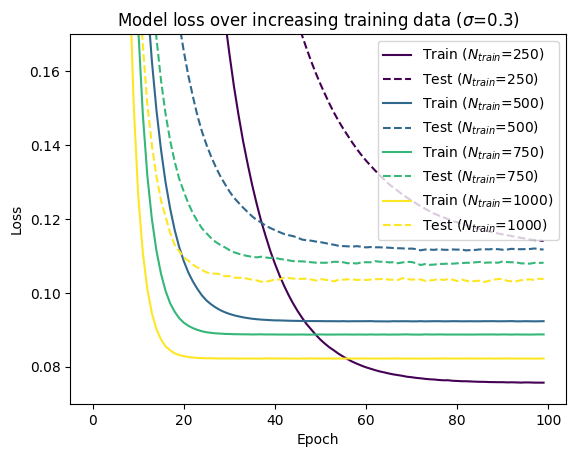

In [30]:
# look into training history
# Plot training & validation loss values
for i in range(len(N_train)):
    plt.plot(history_3[i].history['loss'], label=f'Train ($N_{{train}}$={N_train[i]})', color=colors[i])
    plt.plot(history_3[i].history['val_loss'], label=f'Test ($N_{{train}}$={N_train[i]})', color=colors[i], linestyle='dashed')
    
plt.title('Model loss over increasing training data ($\sigma$=0.3)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='best')

plt.ylim(0.07, 0.17)
plt.show()

Anche nel caso con rumore si può verificare l'incremento della velocità di convergenza all'aumentare del numero di dati di addestramento. Si nota, come prevedibile, che l'errore raggiunto in questo caso è un ordine di grandezza in più rispetto al caso senza rumore.
Un aspetto interessante è il fatto che la convergenza è però più rapida in questo caso. L'introduzione del rumore porta probabilemente a un modello che ammette una discrepanza maggiore nella previsione dei dati, pertanto è possibile arrestare prima l'addestramento.
L'ultima osservazione riguarda il fatto che l'errore più basso nei dati di training si è raggiunto con meno dati di addestramento, ma in molte più epoche.

L'ultima analisi aggiuntiva riguarda il numero di dati di validazione. Verrà utilizzato: $N_{train}=500$, $\sigma=0$ e $N_{test}=25, 50, 100, 200$

In [35]:
# genero dei set di dati di validazione di numero diverso
N_valid = [25*(2**i) for i in range(4)]
x_valid_4 = [np.random.uniform(-1, 1, n_v) for n_v in N_valid]  # valori input per la validazione
for i in range(len(N_valid)):
    x_valid_4[i].sort()                         

sigma_4 = 0
y_valid_4 = [np.random.normal(m * x_v + b, sigma_4) for x_v in x_valid_4] # lista di diversi dati di validazione da usare

# per i valori di x di training lascio li stessi del primo blocco, per i valori di training y prendono invece quelli ottenuti con sigma=0


In [36]:
# creo un modello per ogni set di dati di addestramento
model_4 = [tf.keras.Sequential() for _ in N_valid]

# creo una rete a un neurone per ogni dataset di addestramento
for i in range(len(N_valid)):
    model_4[i].add(Dense(1, input_shape=(1,)))
    model_4[i].compile(optimizer='sgd', loss='mse', metrics=['mse'])

# uso y_train[0] ovvero quello con sigma=0
history_4 = [
    model_4[i].fit(
        x=x_train, y=y_train[0],
        batch_size=32, epochs=100, 
        shuffle=True, # a good idea is to shuffle input before at each epoch
        validation_data=(x_valid_4[i], y_valid_4[i]))
    for i in range(len(N_valid))
]

# return weights and biases
for n in range(len(N_valid)):
    print(f"Weight for model with {N_valid[i]} validating data:")
    model_4[i].get_weights()

# evaluate model
score_4 = [model_4[i].evaluate(x_valid_4[i], y_valid_4[i], batch_size=32, verbose=0) for i in range(len(N_valid))] # verbose=1 stampa i dettagli dell'addestramento

# print performance
for i in range(len(N_valid)):
    print(f"Performances of NN with {N_valid[i]} validating data")
    print('Test loss, valid:', score_4[i][0])
    print('Test accuracy, valid:', score_4[i][1])

Epoch 1/100
16/16 [==============================] - 1s 15ms/step - loss: 2.7562 - mse: 2.7562 - val_loss: 2.4851 - val_mse: 2.4851
Epoch 2/100
16/16 [==============================] - 0s 7ms/step - loss: 2.0152 - mse: 2.0152 - val_loss: 1.8217 - val_mse: 1.8217
Epoch 3/100
16/16 [==============================] - 0s 9ms/step - loss: 1.5211 - mse: 1.5211 - val_loss: 1.3594 - val_mse: 1.3594
Epoch 4/100
16/16 [==============================] - 0s 6ms/step - loss: 1.1665 - mse: 1.1665 - val_loss: 1.0365 - val_mse: 1.0365
Epoch 5/100
16/16 [==============================] - 0s 5ms/step - loss: 0.9084 - mse: 0.9084 - val_loss: 0.7990 - val_mse: 0.7990
Epoch 6/100
16/16 [==============================] - 0s 5ms/step - loss: 0.7145 - mse: 0.7145 - val_loss: 0.6231 - val_mse: 0.6231
Epoch 7/100
16/16 [==============================] - 0s 5ms/step - loss: 0.5662 - mse: 0.5662 - val_loss: 0.4890 - val_mse: 0.4890
Epoch 8/100
16/16 [==============================] - 0s 5ms/step - loss: 0.4503 - 

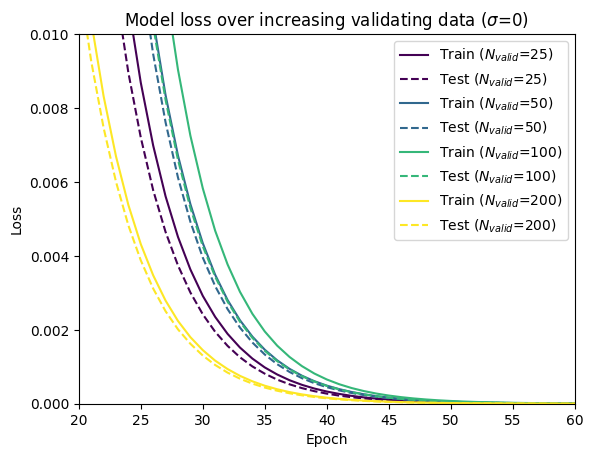

In [43]:
# look into training history
# Plot training & validation loss values
for i in range(len(N_valid)):
    plt.plot(history_4[i].history['loss'], label=f'Train ($N_{{valid}}$={N_valid[i]})', color=colors[i])
    plt.plot(history_4[i].history['val_loss'], label=f'Test ($N_{{valid}}$={N_valid[i]})', color=colors[i], linestyle='dashed')
    
plt.title('Model loss over increasing validating data ($\sigma$=0)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='best')

plt.ylim(0, 0.01)
plt.xlim(20, 60)
plt.show()

Si ricorda che il numero di default dei dati di validazione è $50$. Dall'ultima analisi emerge un fatto inaspettato: non vi è una dipendenza chiara tra il numero di dati di validazione e la velocità di convergenza.
Dal più lento al più rapido (da errore maggiore a errore minore), infatti, i risultati mostrano questo ordine: $N_{valid}=100$, $50$, $25$, $200$.
Per il modello creato, risulta quindi ragionevole la scelta di default di $N_{valid}=50$.

## Conclusioni
Com'era prevedibile, aumentare il numero di epoche riduce l'errore sui dati di validazione, tuttavia ciò potrebbe causare problemi di overfitting. L'effetto più importante sulla velocità di convergenza lo ha il numero di dati di training, per cui un numero maggiore garantisce meno errore a parità di epoche.<br>
Un dataset di training e un dataset di dati di validazione affetti da errore maggiore rallenta la velocità di addestramento, ma questo effetto è bilanciabile aumentando il numero dei dati. <br>

## 11.2 - Fit di un polinomio di ordine 3
In questo secondo punto verrà esteso il modello appena creato, in modo da ottenere un fit di un polinomio di terzo grado con la seguente espressione analitica:

$$
f(x)=4-3x-2x^2+3x^3
$$
per $x \in [-1,1]$.

In questo caso verrà migliorato il modello sulla base del numero di layers, del numero di neuroni per layer, della funzione di attivazione, dell'ottimizzatore e della funzione di perdita. Verrà inoltre mostrato quanto bene il modello prevede i dati anche al di fuori dell'intervallo di training. 

In [47]:
import numpy as np
# plot validation and target dataset
import matplotlib.pyplot as plt

# compose the NN model
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input # Activation
from tensorflow.keras import backend as K
# from tensorflow.keras.utils import get_custom_objects

# Funzione per creare il modello
def create_model(neurons_per_layer: list, param: dict):
  """Funzione che crea un modello NN e i relativi grafici dei risultati di fit al variare dei layer,
   e del numero di neuroni per layer. In ingresso riceve una lista del tipo [n_1, n_2, n_3, .., n_k],
   per indicare che il primo layer ha n_1 neuroni e il k-esimo layer ne ha n_k
   Il layer zero e l'ultimo vengono aggiunti in automatico e contengono entrambi 1 neurone (perché si fitta
   una funzione scalare a una variabile)"""
  
  # generate training inputs
  np.random.seed(0)


  # target parameters of f(x) = a*x^3 + b*x^2 + c*x +d
  a = 3
  b =-2
  c =-3
  d = 4

  def f(x):
    return a*x**3 + b*x**2 + c*x + d 
                              
  x_train = np.random.uniform(-1, 1, 500)
  x_valid = np.random.uniform(-1, 1, 50)
  x_valid.sort()
  x_test = np.random.uniform(-1, 1, 200)  # to fit complete function in [-1,1]
  x_test.sort()
  y_target = f(x_test) # funzione ideale target

  sigma = 0.1           # rumore
  y_train = np.random.normal(f(x_train), sigma) # valori y di training dal quale estrarre i parametri di fit
  y_valid = np.random.normal(f(x_valid), sigma) # valori y di validazione

  # costruzione della rete
  n_layers = len(neurons_per_layer)+2 # aggiungo il conteggio del primo e dell'ultimo 

  model = Sequential()
  # aggiungo prima l'input layer, separatamente perché devo specificare la shape
  model.add(Input(shape=(1,)))  # Aggiungi l'input layer
  # in realtà è sempre 1 perché ho in ingresso un numero scalare x ogni volta e in automatico fissa il layer input con un neurone (shape=1)
  # model.add(Dense(1, input_shape=(1,), activation=param["activation"]))

  # per tutti gli altri neuroni per layer non è necessario specificare la shape (la prende in automatico dal primo layer)
  for num_neurons in neurons_per_layer:
    model.add(Dense(num_neurons, activation=param["activation"]))
  model.add(Dense(1, activation=param["activation"]))  # Layer di output, un solo nodo perché ho un solo output
  model.compile(optimizer=param["optimizer"], loss=param["loss_func"], metrics=[param["metric"]])

  history = model.fit(x=x_train, y=y_train, batch_size=32, epochs=param["epochs"], shuffle=True, 
                      validation_data=(x_valid, y_valid), verbose=0)
  
  title = "1,"
  for n in neurons_per_layer:
    title += str(n) + ","
  title += "1"

  # plot dell'errore durante l'addestramento
  plt.figure(figsize = (18,5))
  plt.subplot(1, 3, 1)
  plt.plot(history.history['loss']) # plot della loss function per i dati di training
  plt.plot(history.history['val_loss']) # plot della loss function per i dati di validazione
  plt.ylim(-0.2, 2)

  plt.title("$N_{neuroni}$ per (" + str(n_layers) + ") layer:" + title)
  plt.ylabel('loss')
  plt.xlabel('Epoche')
  plt.legend(['Train', 'Test'], loc='best')
  plt.grid(True)

  # plot delle previsioni nell'intervallo di addestramento
  plt.subplot(1, 3, 2)
  x_predicted = np.random.uniform(-1, 1, 100)
  y_predicted = model.predict(x_predicted)
  plt.scatter(x_predicted, y_predicted,color='r', s=10, label="Predizione")
  plt.plot(x_test, y_target, label="Funzione Target")
  plt.title("Predizione")
  plt.ylabel('y')
  plt.xlabel('x')
  plt.xlim(-1,1)
  plt.grid(True)
  plt.legend()

  # plot previsioni anche fuori dall'intervallo di addestramento
  plt.subplot(1,3,3)
  x_predicted_out = np.random.uniform(-2, 2, 100)
  x_test_out = np.random.uniform(-2, 2, 100)
  y_predicted_out = model.predict(x_predicted_out)
  x_test_out.sort() # sorting to plot target function
  y_target_out = f(x_test_out)

  plt.scatter(x_predicted_out, y_predicted_out, color='r', s=10, label="Predizione")
  plt.plot(x_test_out, y_target_out, label="Funzione Target")
  plt.title("Predizione fuori dall'intervallo di taining")
  plt.axvline(x=-1, color='black', linewidth=0.8)
  plt.axvline(x=1, color='black', linewidth=0.8)
  plt.ylabel('y')
  plt.xlabel('x')
  
  plt.grid(True)
  plt.legend()

  plt.tight_layout()
  plt.show()


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


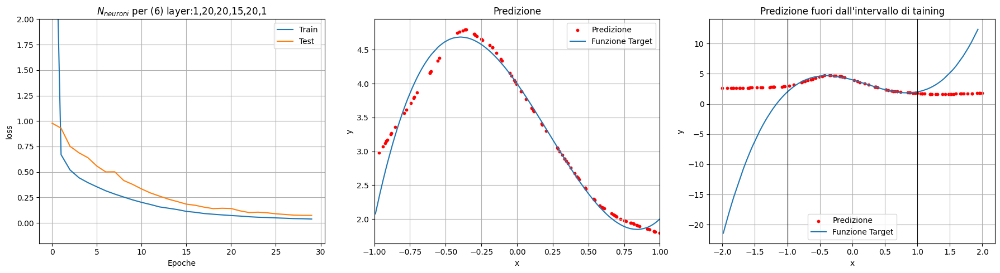

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


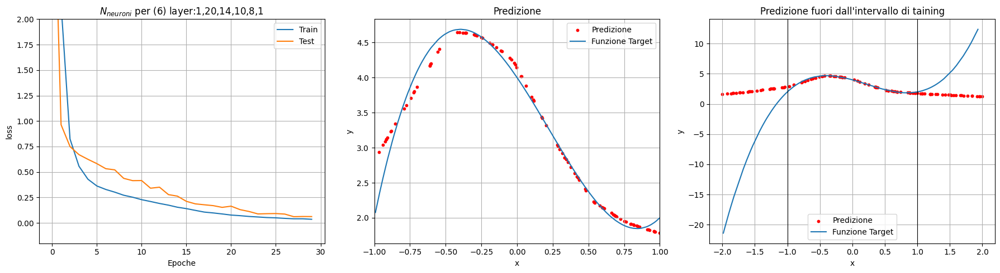

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


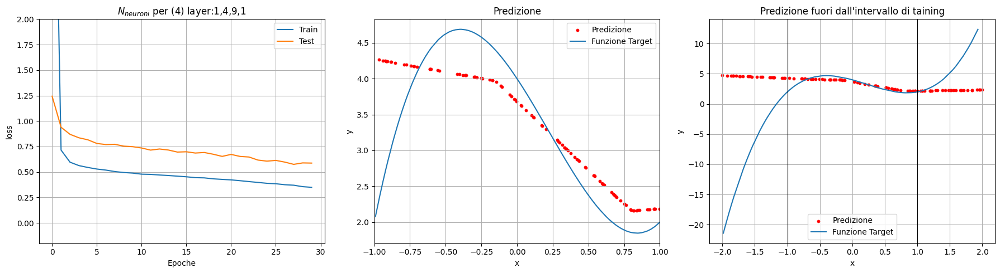

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


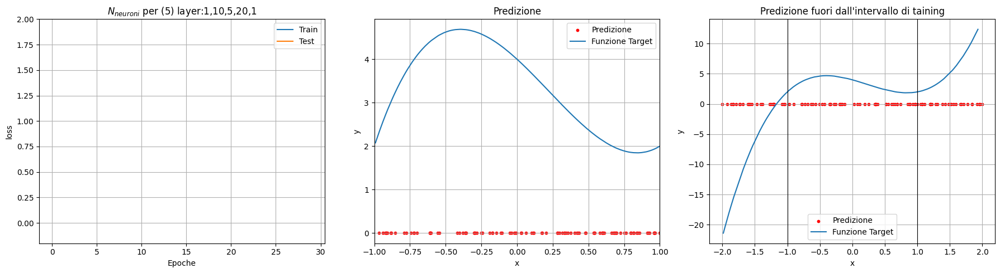

In [48]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_1 = {
    "activation": 'relu',   # funzione di attivazione
    "optimizer": 'sgd',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

# configurazioni che non vanno:
# [1], [5], [20]
# [1,1], [5,1], [50,50]
# [10,10,10]
# [20,20,20,15],
# [20,20,20,10],
# [20,20,20,5],
# [20,20,10,20],
# [20,15,20,20],
# [20,10,20,20],
# [15,20,20,20],
# [5,20,20,20]

NN_list = [
    [20,20,15,20],
    [20,14,10,8],
    [4,9],
    [10,5,20],
    ]

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_1)




Come è possibile notare, la configurazione migliore sembra prediligere $4$ layer nascosti; molte delle altre possibili configurazioni, tra cui $1$, $2$ o $3$ layers non hanno mostrato risultati soddisfacenti. <br>
Di seguito verranno mostrati i risultati ottenuti al variare degli altri parametri, mantenendo però queste stesse configurazioni di layer e neuroni, in modo da rendere più facile il paragone.

### Test di altre Funzioni di attivazione
Successivamente sono state provate diverse altre funzioni di attivazione, a parità di configurazione della rete in termini di layer e neutroni per layer. Si è trovato che "sigmoid", "tanh" e "softmax" non riescono a riprodurre nessun tipo di fit, mentre "selu" riesce a performare meglio di "relu" mostrato in precedenza.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


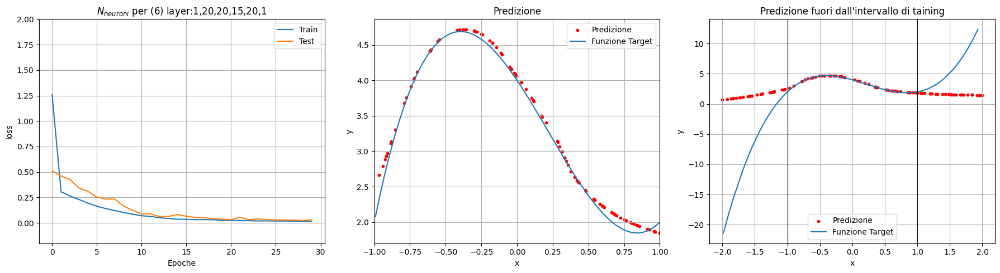

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


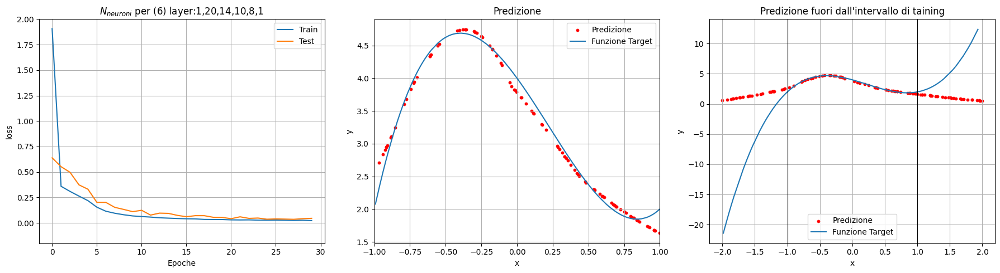

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


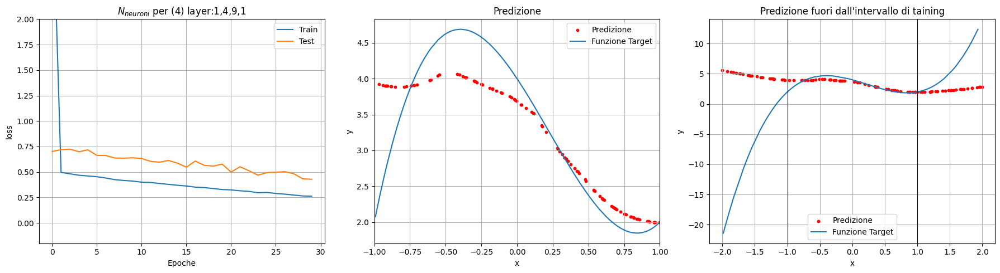

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


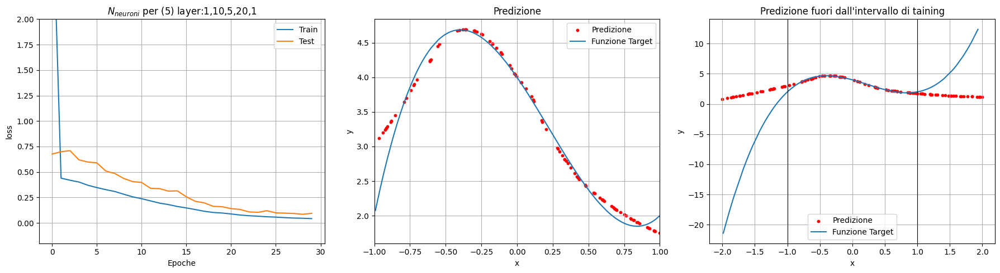

In [53]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_2 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'sgd',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_2)


### Test di altri tipi di funzioni Loss
Di seguito viene cambiata la funzione di perdita "mse" (mean squared error), mantenendo la funzione di attivazione "selu". L'utilizzo della funzione "mae" (mean absolute error) presenta una riduzione della capacità di fitting, mentre l'utilizzo di "huber" non presenta significative migliorie.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


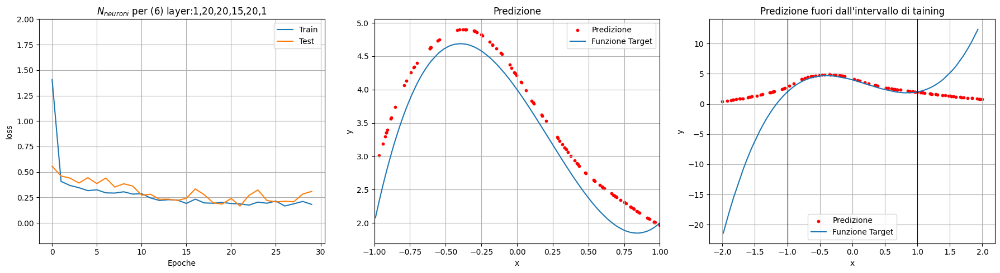

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


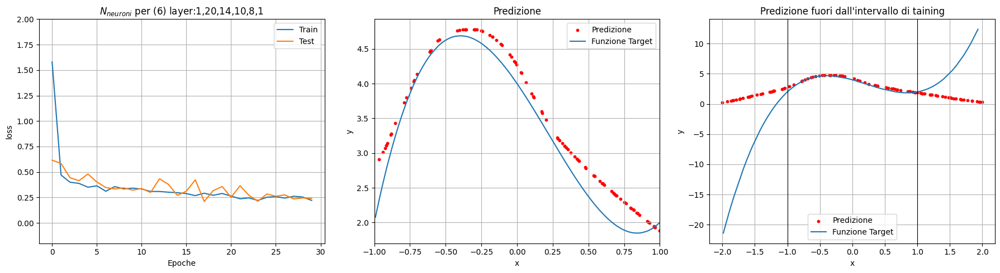

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


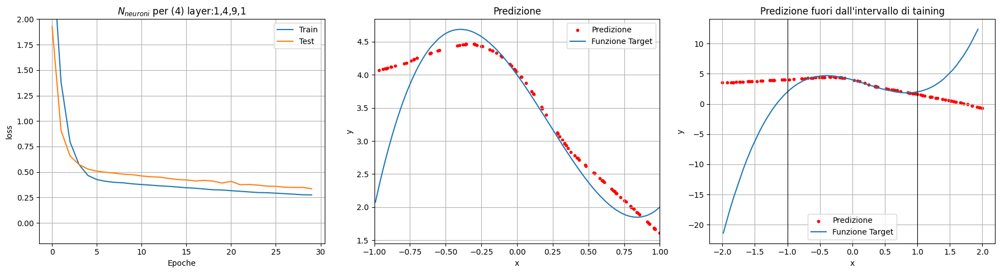

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


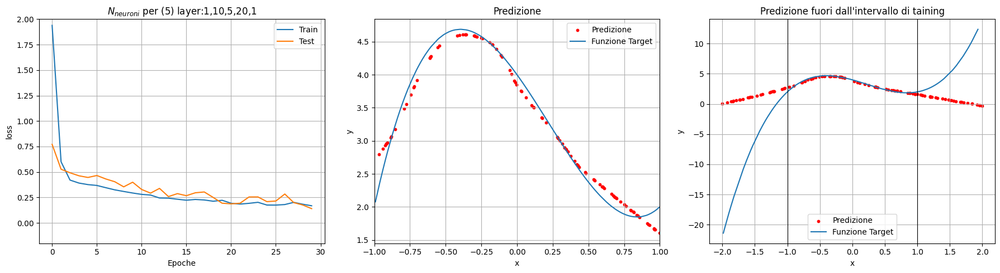

In [57]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_3 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'sgd',     # ottimizzatore
    "loss_func": 'mae',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_3)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


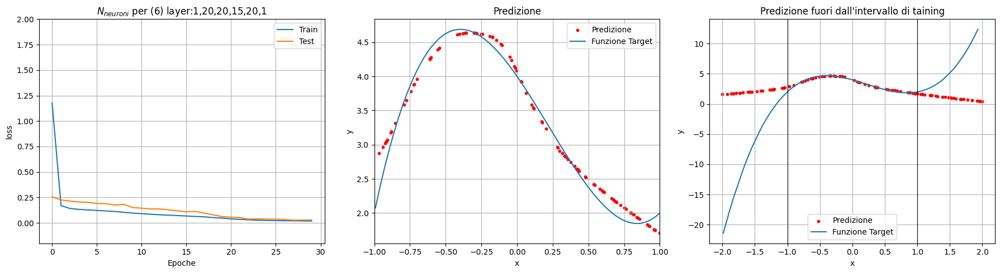

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


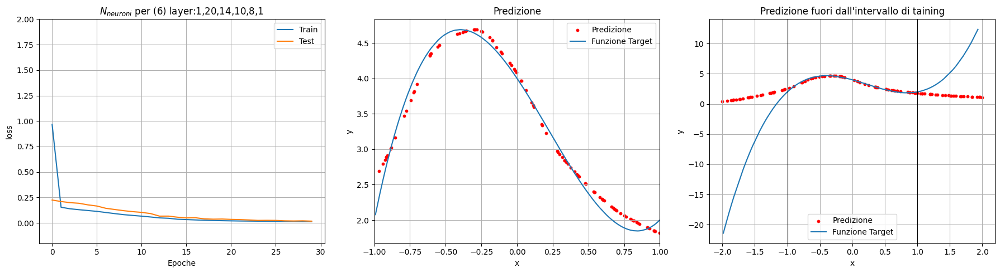

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


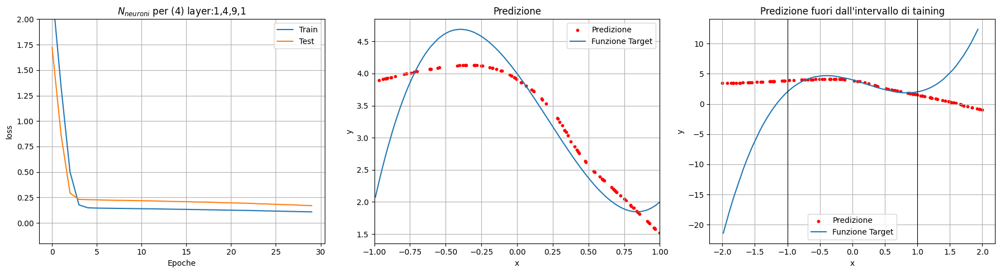

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


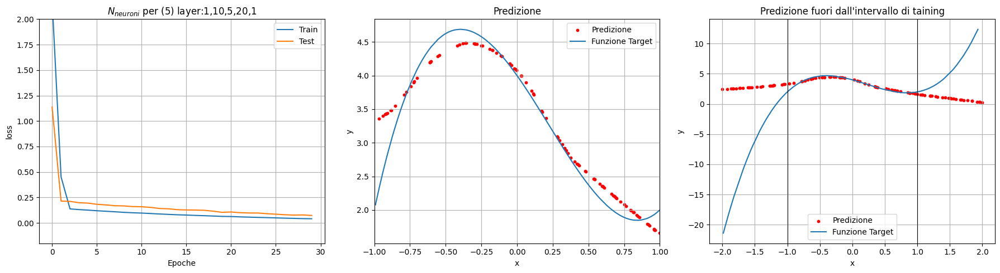

In [56]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_4 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'sgd',     # ottimizzatore
    "loss_func": 'huber',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_4)

### Test di altri tipi di ottimizzatori
Di seguito viene modificato l'ottimizzatore "sgd". Tutte gli ottimizzatori testati performano peggio: "Adam", "NAdam","RMSprop","AdaGrad","AdaMax".

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


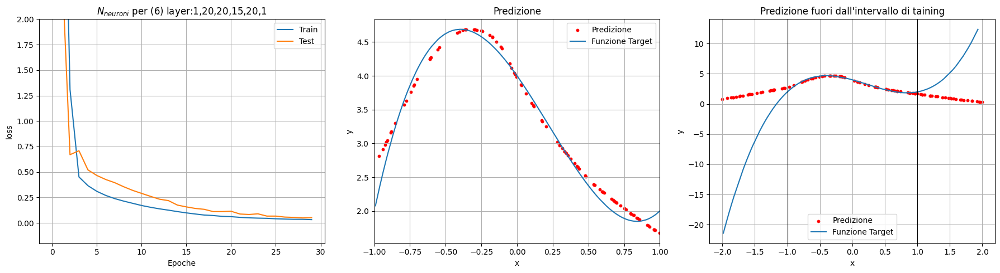

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


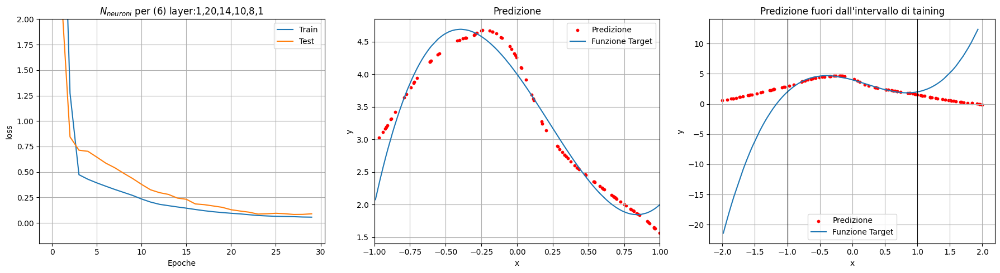

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


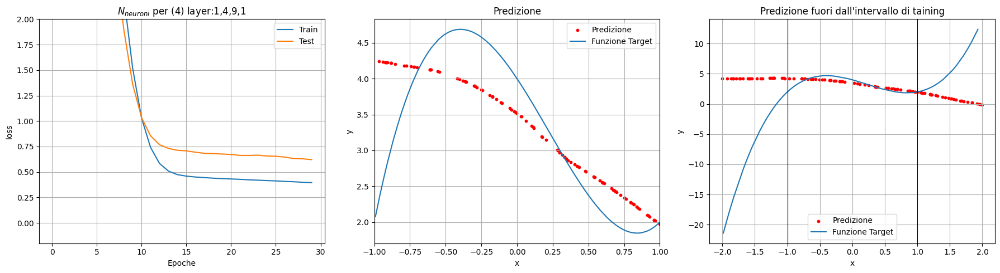

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


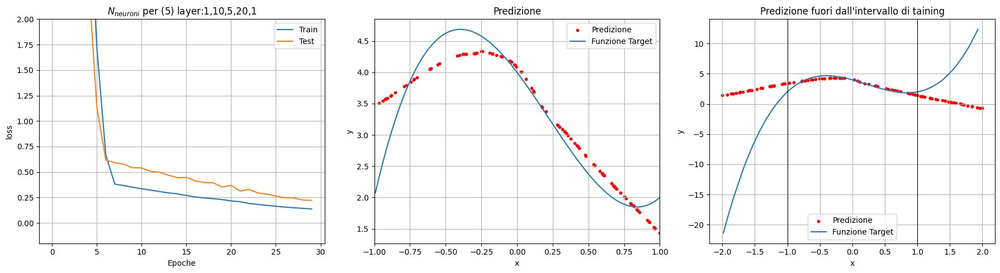

In [58]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_5 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'Adam',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_5)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


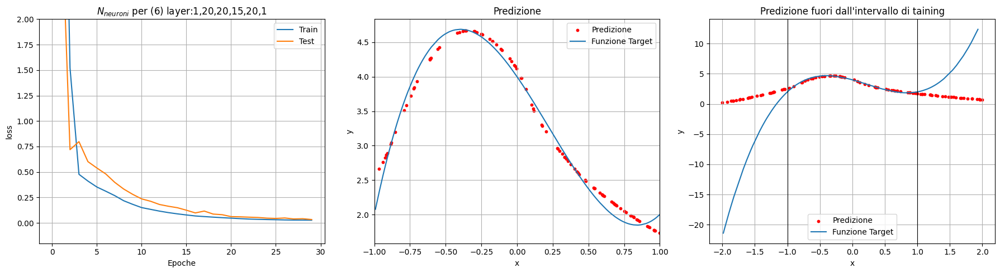

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


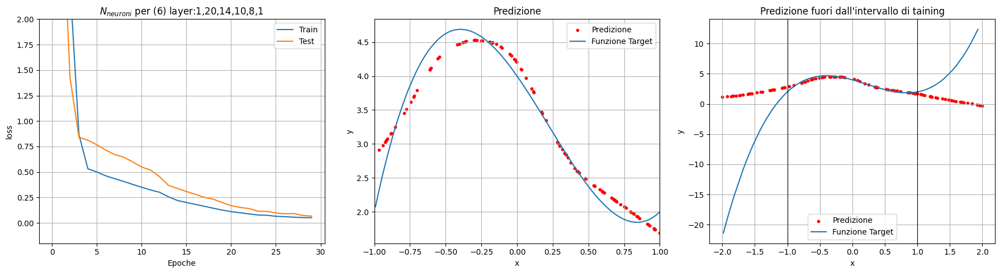

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


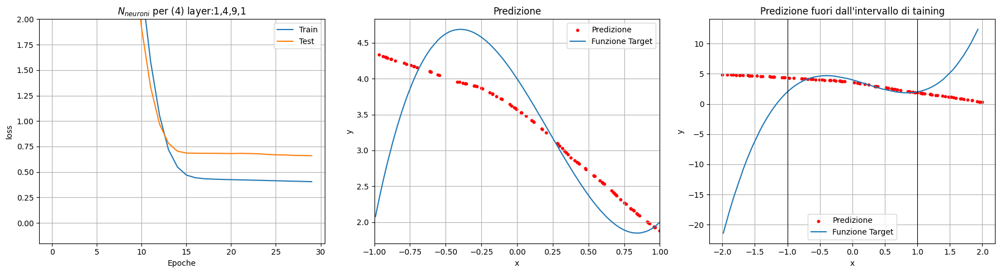

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


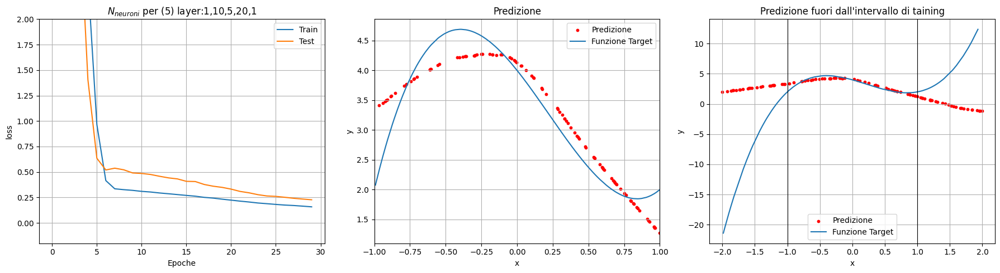

In [59]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_6 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'NAdam',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_6)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


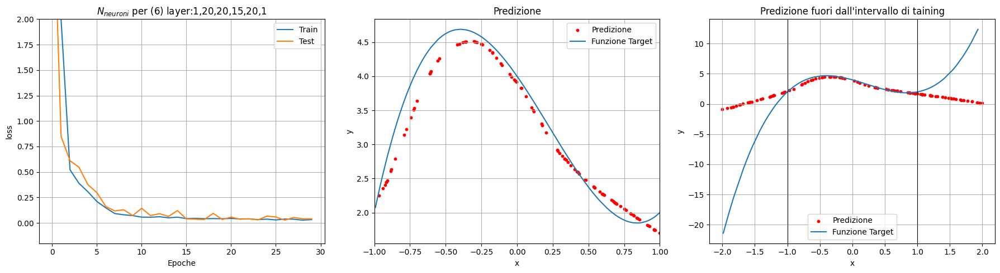

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


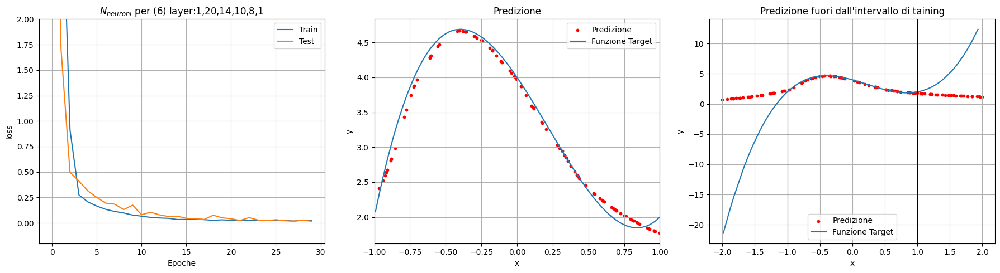

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


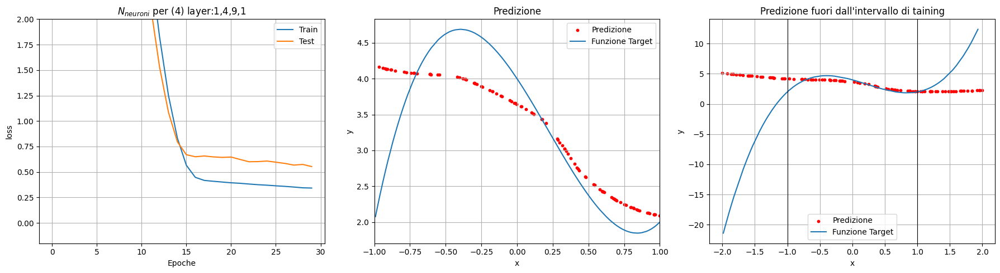

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


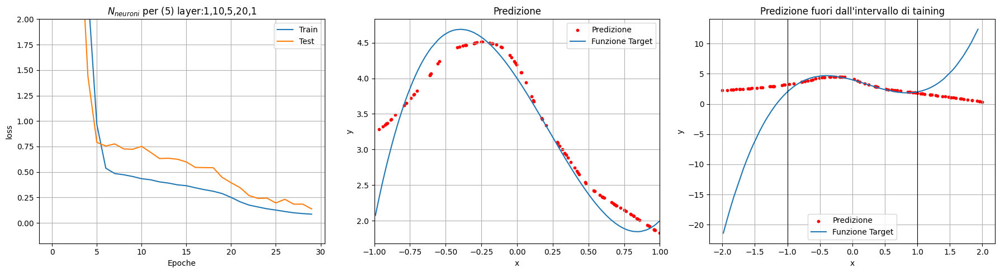

In [60]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_7 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'RMSprop',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_7)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


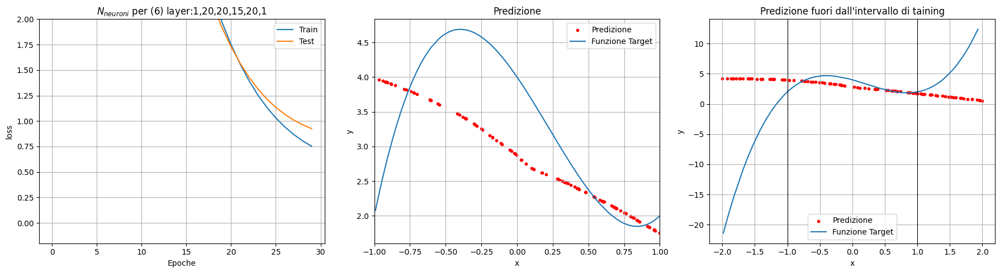

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


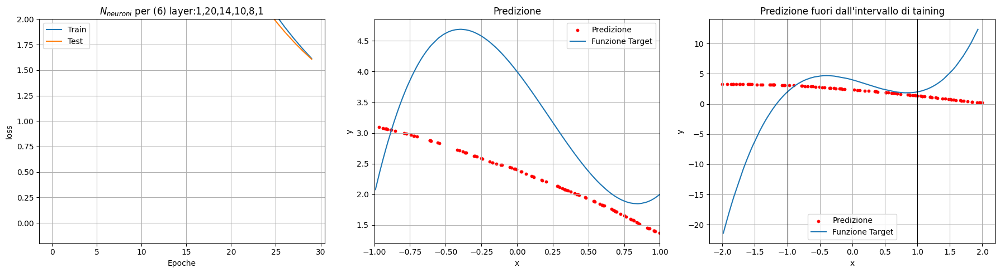

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


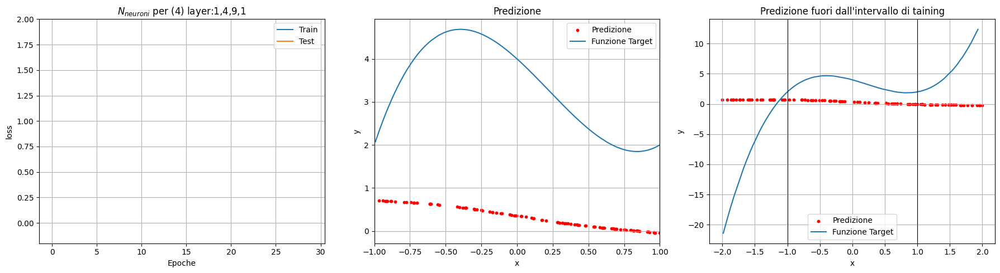

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


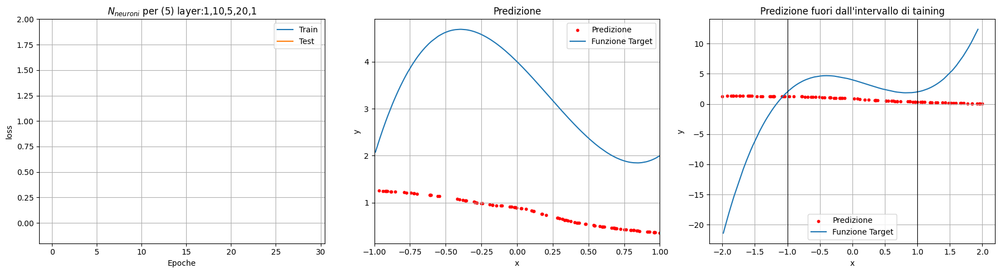

In [61]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_8 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'AdaGrad',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_8)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


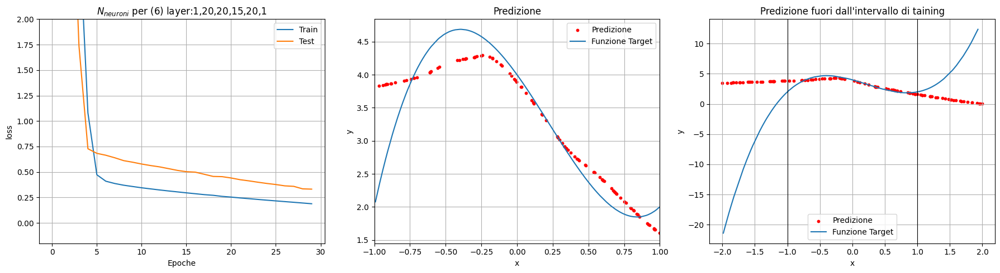

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


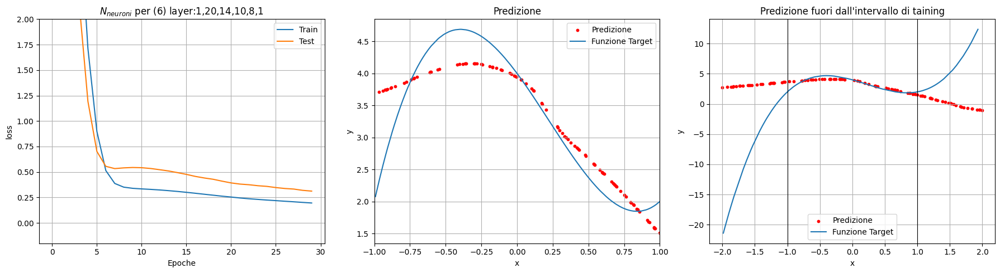

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


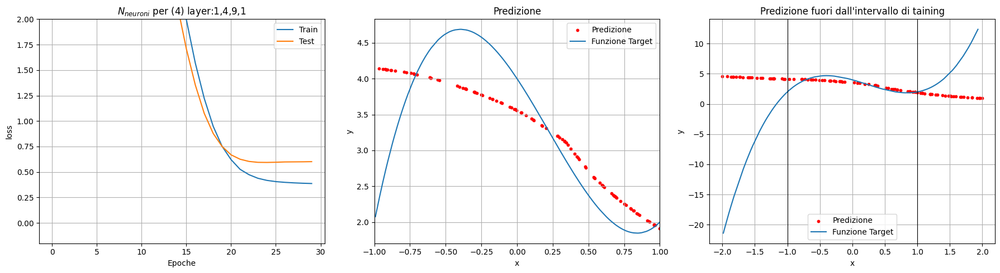

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


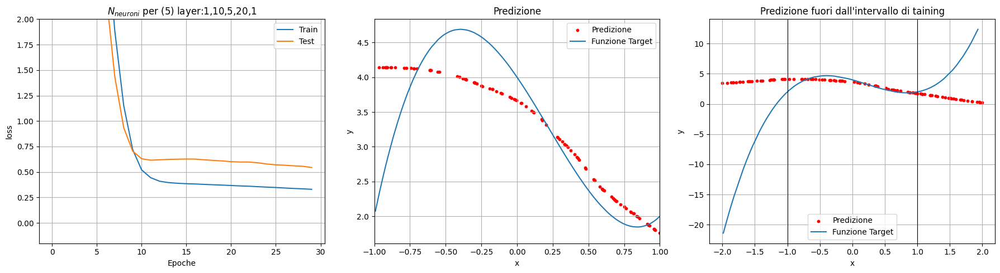

In [62]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
parameters_9 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'AdaMax',     # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 30,
}

for NN in NN_list:
    create_model(neurons_per_layer=NN, param=parameters_9)

## Conclusioni
Da tutti i test eseguiti è emersa la difficoltà nel trovare la configurazione migliore. Globalmente quella che ha raggiunto l'errore minore in meno epoche è stata la configurazione di neuroni per layer $[1,20,14,8,1]$ con funzione di attivazione "selu", ottimizzatore "RMSprop" e funzione di perdita "mse". <br>
Da ogni singola prova svolta è risultata l'impossibilità di prevedere l'andamento della funzione al di fuori dell'intervallo di training (terzo grafico), ciò potrebbe essere dovuto a principi di overfitting.

## 11.3 - Fit di una funzione 2D
In questo punto si cercherà di estendere il modello di rete neurale al fit della funzione 2D trigonometrica
$$
f(x,y) = \sin(x^2+y^2)
$$
nell'intervallo $x \in [-3/2,3/2]$ e $y \in [-3/2,3/2]$.

In [10]:
import numpy as np
# plot validation and target dataset
import matplotlib.pyplot as plt

# compose the NN model
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input # Activation
from tensorflow.keras import backend as K
# from tensorflow.keras.utils import get_custom_objects

NN_list = [
    [8,20,8],
    [20,25,15,20],
    [20,14,10,8]
    ]

# Funzione per creare il modello
def create_2Dmodel(neurons_per_layer: list, param: dict):
  """Funzione che crea un modello NN e i relativi grafici dei risultati di fit al variare dei layer,
   e del numero di neuroni per layer. In ingresso riceve una lista del tipo [n_1, n_2, n_3, .., n_k],
   per indicare che il primo layer ha n_1 neuroni e il k-esimo layer ne ha n_k.
   Il layer zero e l'ultimo vengono aggiunti in automatico e contengono 2 neuroni il primo e uno l'ultimo
   (perché si fitta una funzione scalare a due variabili)"""
  
  def f(x,y):
      return np.sin(x**2 + y**2)

  np.random.seed(0)
  x_train = np.random.uniform(-1.5, 1.5, 500)
  x_valid = np.random.uniform(-1.5, 1.5, 50)
  x_valid.sort()
  y_train = np.random.uniform(-1.5, 1.5, 500)
  y_valid = np.random.uniform(-1.5, 1.5, 50)
  y_valid.sort() # sta volta riordino anche y perché è un altro input
  # z_target =  f(x_valid,y_valid) # valori target ideali

  sigma = 0.1 # noise standard deviation
  z_train = np.random.normal(f(x_train,y_train), sigma) # misure da fittare
  z_valid = np.random.normal(f(x_valid,y_valid), sigma)
                   
  # costruzione della rete
  n_layers = len(neurons_per_layer)+2 # aggiungo il conteggio d primo e dell'ultimo 

  model = Sequential()
  # aggiungo prima l'input layer, separatamente perché devo specificare la shape
  model.add(Input(shape=(2,)))  # Aggiungo l'input layer, shape 2 perché prende in ingresso x e y

  # per tutti gli altri neuroni per layer non è necessario specificare la shape (la prende in automatico dal primo layer)
  for num_neurons in neurons_per_layer:
    model.add(Dense(num_neurons, activation=param["activation"]))
  model.add(Dense(1, activation=param["activation"]))  # Layer di output, un solo nodo perché ho un solo output z
  model.compile(optimizer=param["optimizer"], loss=param["loss_func"], metrics=[param["metric"]])

  # unisco gli array monodimensionali x e y in un array bidimensionale, poi lo traspongo,
  # in questo modo creao una coppia di punti x,y accoppiati
  history = model.fit(x=np.array([x_train,y_train]).T, y= z_train, batch_size=32, epochs=param["epochs"], shuffle=True, 
                      validation_data=(np.array([x_valid, y_valid]).T, z_valid), verbose=0) # con verbose=0 non mostro la barra di caricamento

  title = "2,"
  for n in neurons_per_layer:
    title += str(n) + ","
  title += "1"

  fig = plt.figure(figsize=(16, 7))

  # Plot dei valori di loss di addestramento e validazione
  ax1=fig.add_subplot(1,2,1)
  plt.title("$N_{neuroni}$ per (" + str(n_layers) + ") layer: " + title + ",  attivazione: "+str(param["activation"])
                + ",  loss: "+str(param["loss_func"]) + ",  ottimizzatore: "+str(param["optimizer"]))
  plt.ylim(0, 0.55)
  ax1.plot(history.history['loss'], label="loss")
  ax1.plot(history.history['val_loss'], label="val_loss")
  ax1.set_ylabel('Loss')
  ax1.set_xlabel('Epoche')
  ax1.legend(loc='best')
  ax1.grid(True)
  
  x_predicted = np.random.uniform(-1.5, 1.5, 500)
  y_predicted = np.random.uniform(-1.5, 1.5, 500)
  z_predicted = model.predict(np.array([x_predicted,y_predicted]).T)

  ax2 = fig.add_subplot(1,2,2, projection='3d')
  plt.title("Plot 3D della funzione")
  X,Y = np.meshgrid(x_valid, y_valid)
  ax2.plot_surface(X, Y, f(X, Y), color="r", alpha=0.6, label="test", edgecolor='none') #, cmap='viridis'

  ax2.scatter(x_predicted, y_predicted, z_predicted, color='b', s=5, label="previsione")
  ax2.set_xlabel('x')
  ax2.set_ylabel('y')
  ax2.set_zlabel('z')
  
  # fig.colorbar(surf, ax=ax2, shrink=0.5, aspect=5)
  ax2.legend(loc='best')

  plt.show()

Cambio funzione di attivazione
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


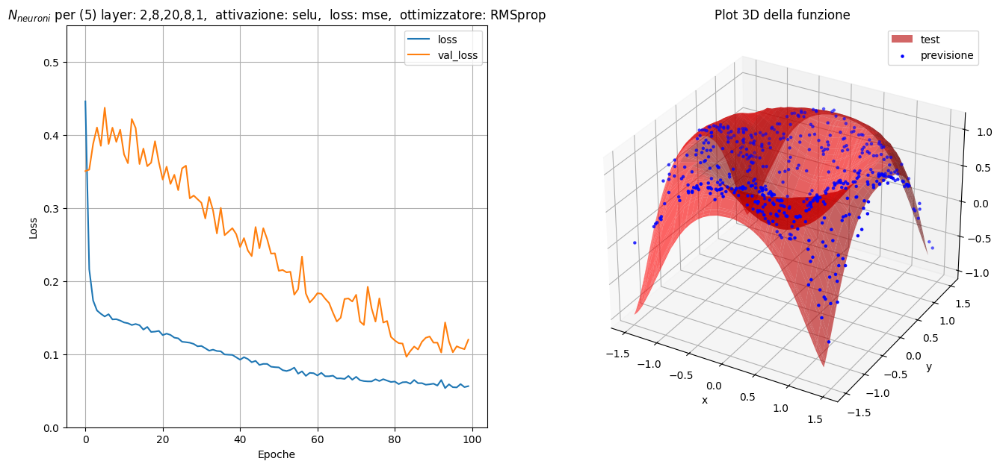

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


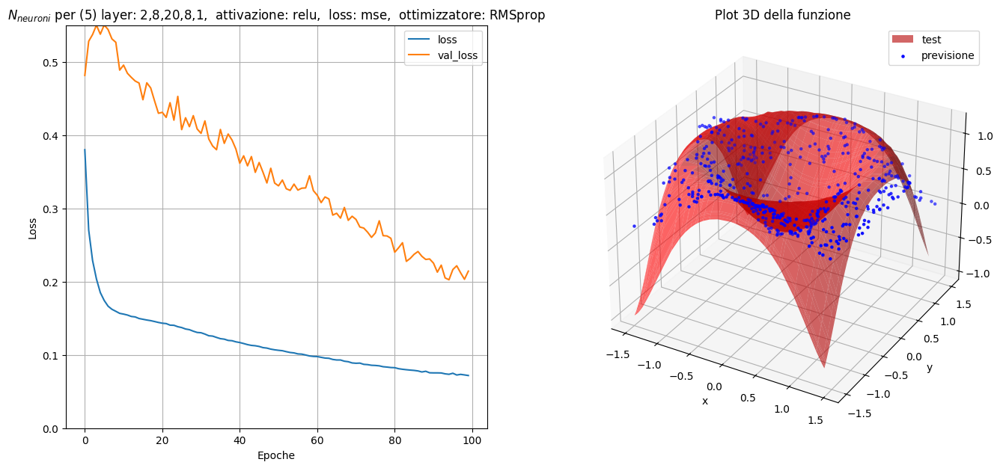

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


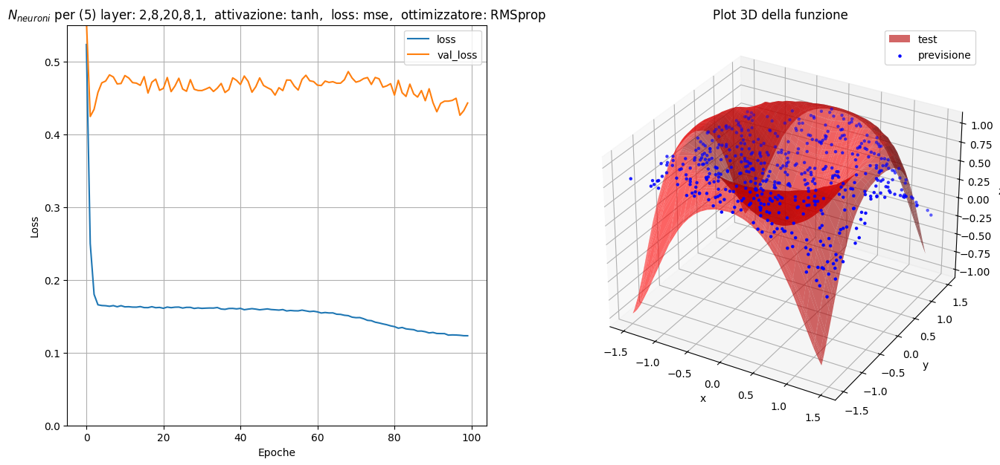

c:\Users\teote\Desktop\uni\2023-2024\Lab_Simulazione_Numerica\venv_dir\lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


12/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

c:\Users\teote\Desktop\uni\2023-2024\Lab_Simulazione_Numerica\venv_dir\lib\site-packages\keras\src\ops\nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


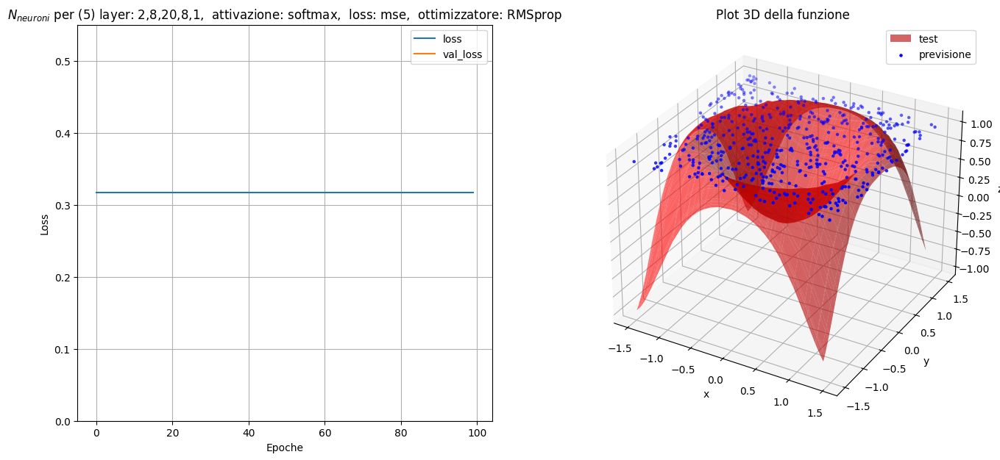

Cambio ottimizzatore
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


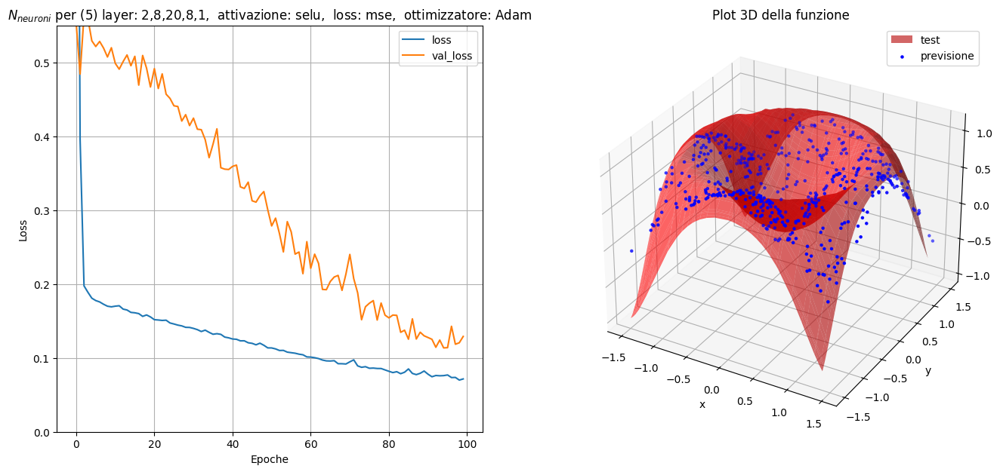

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


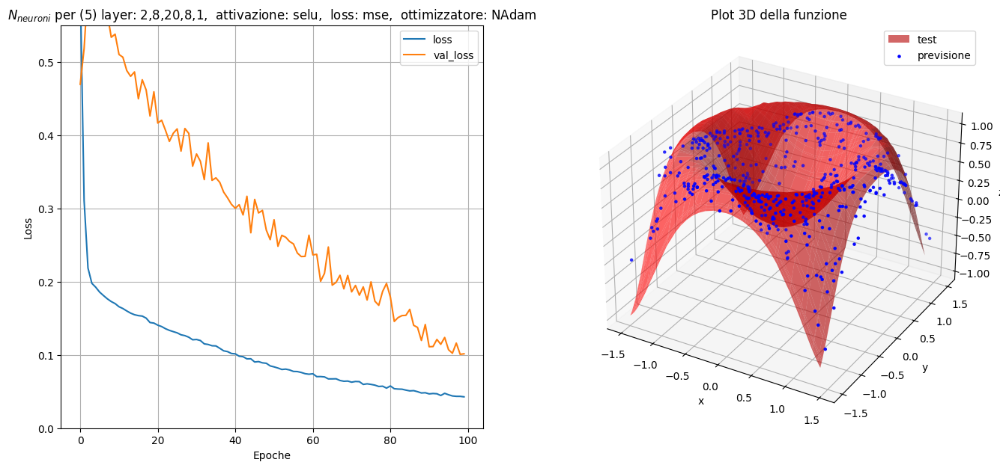

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


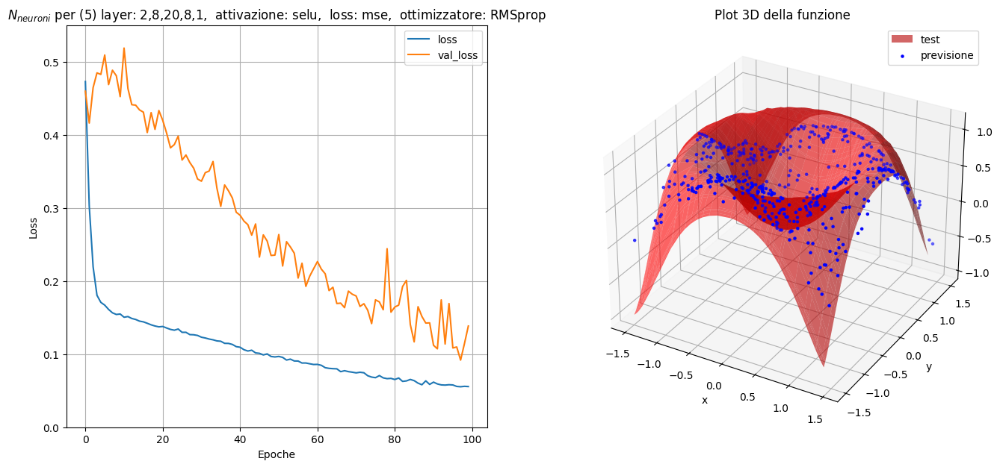

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


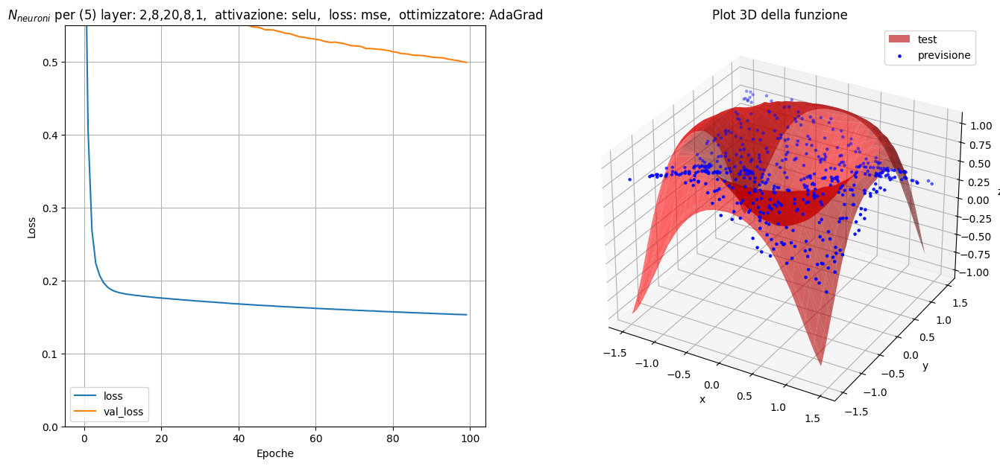

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


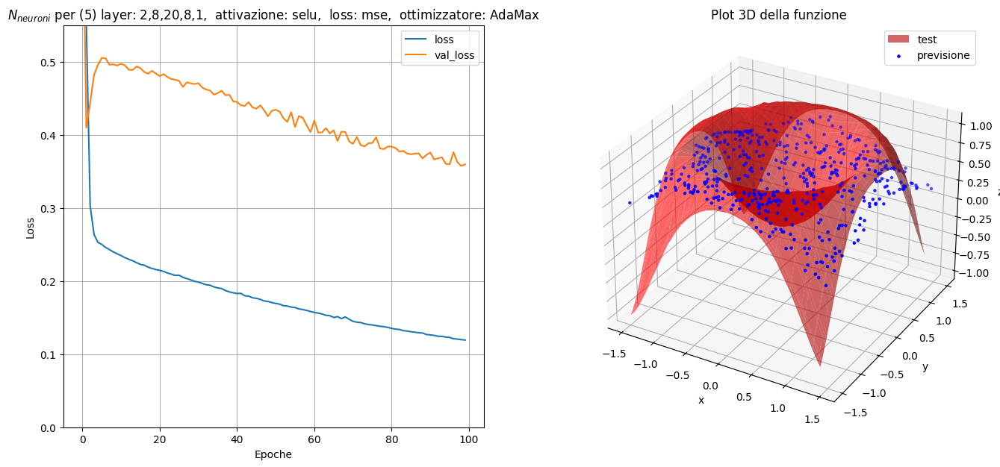

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


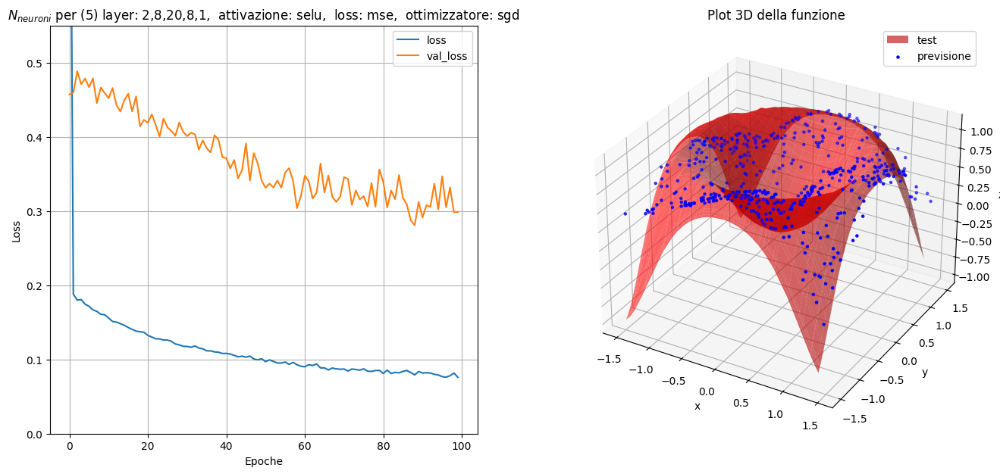

Cambio funzione Loss
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


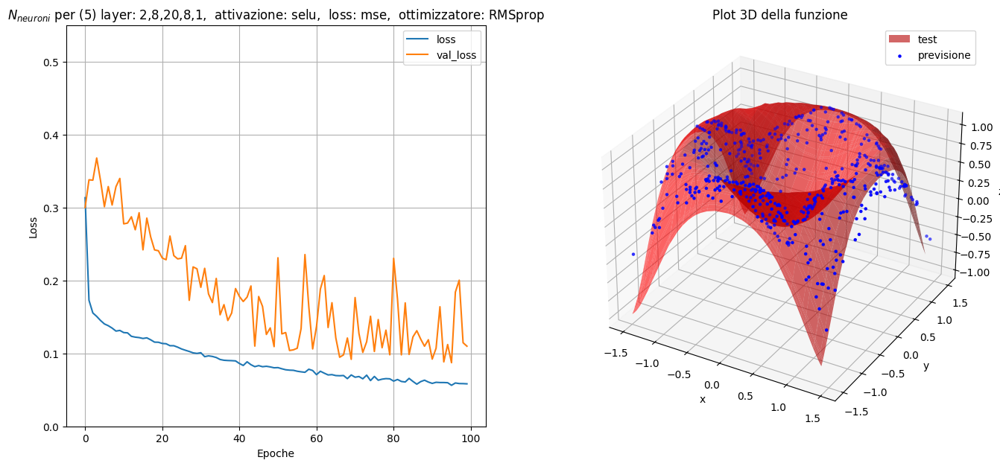

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


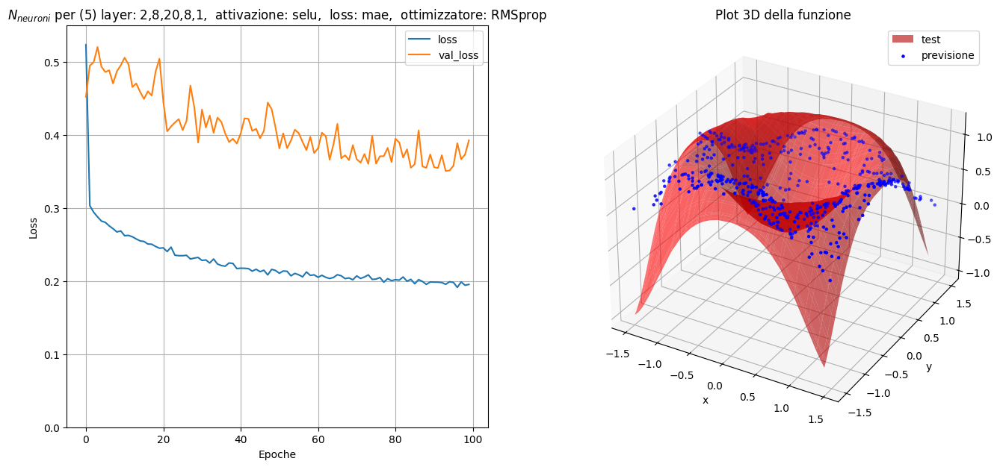

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


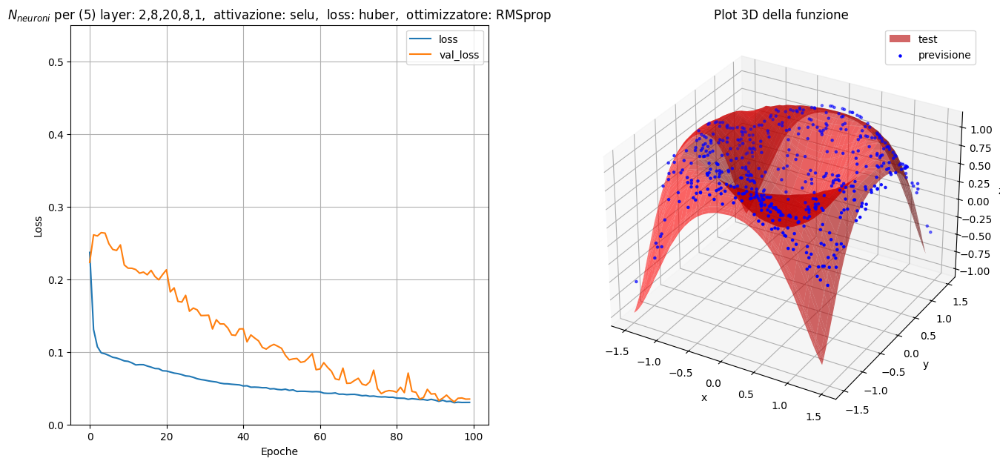

Cambio funzione di attivazione
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


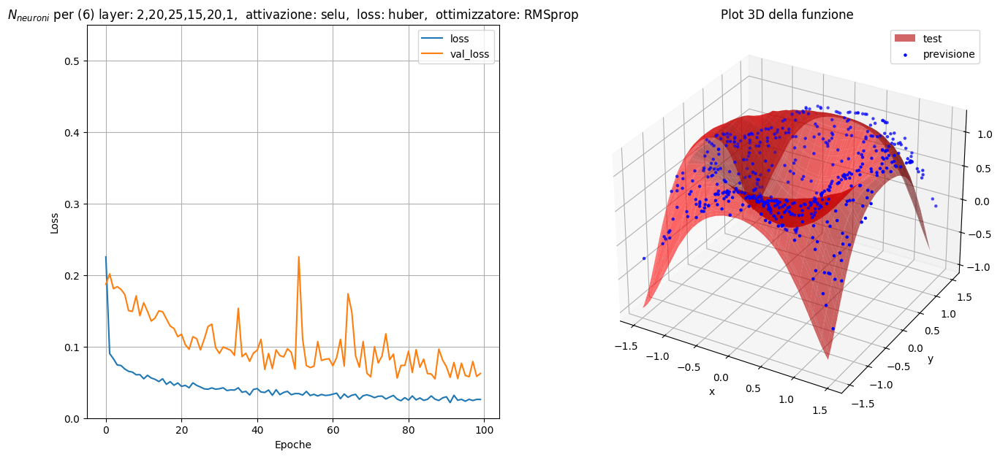

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


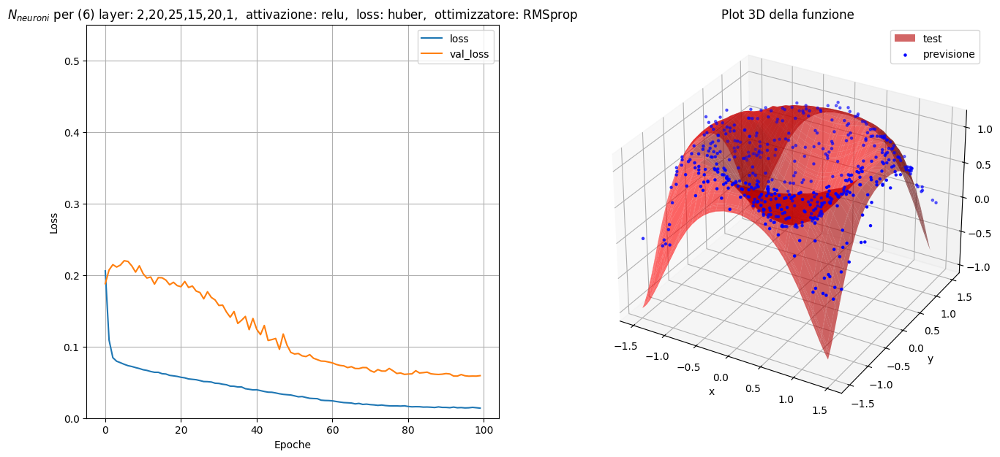

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


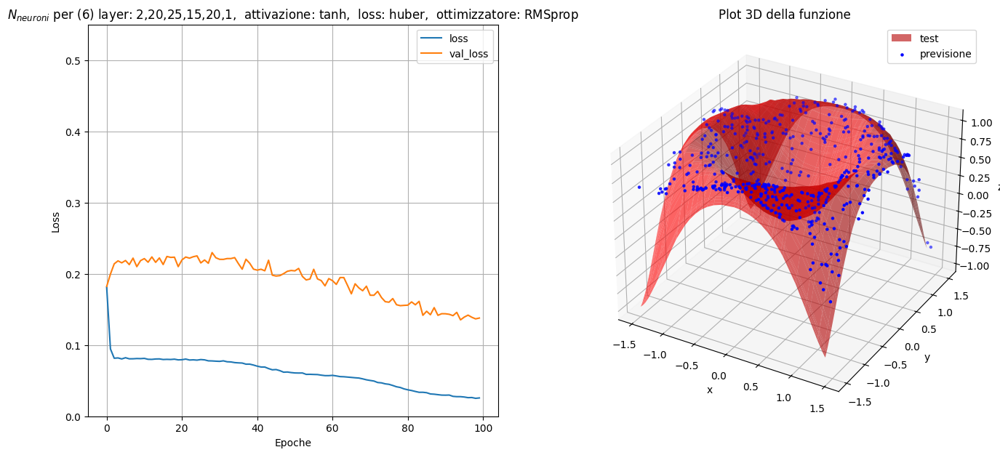

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


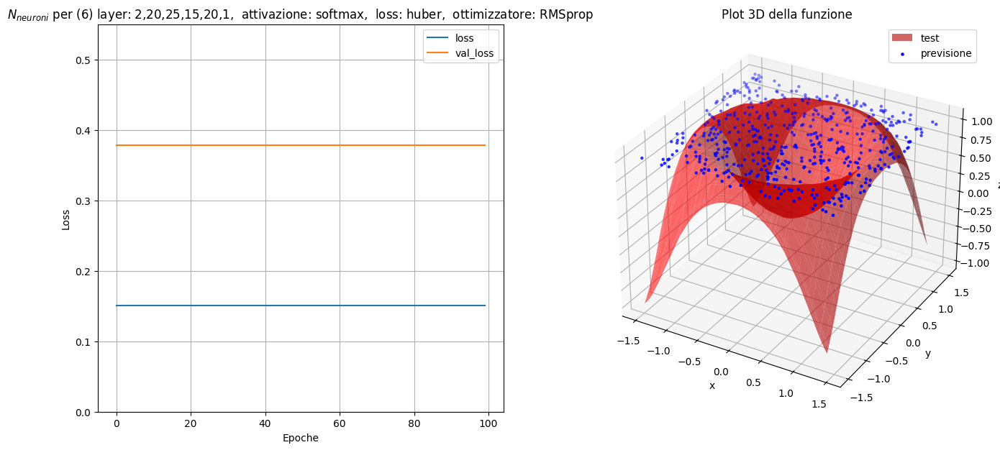

Cambio ottimizzatore
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


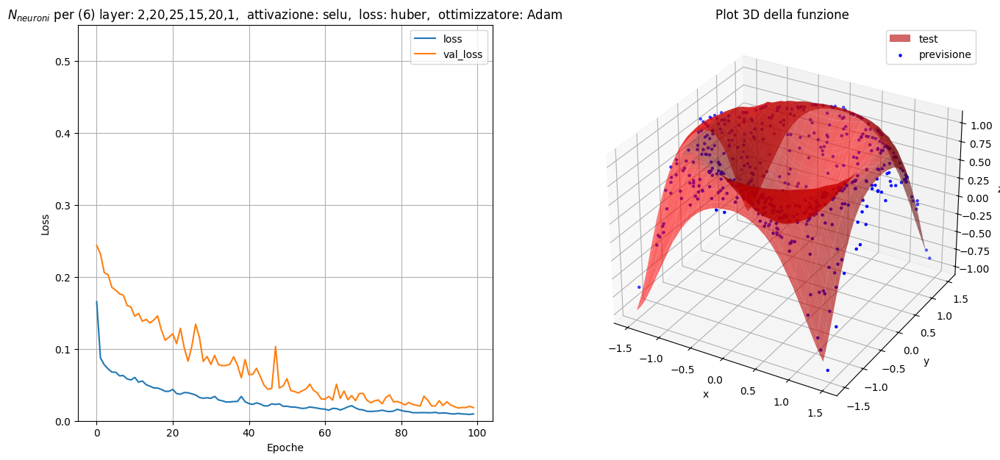

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


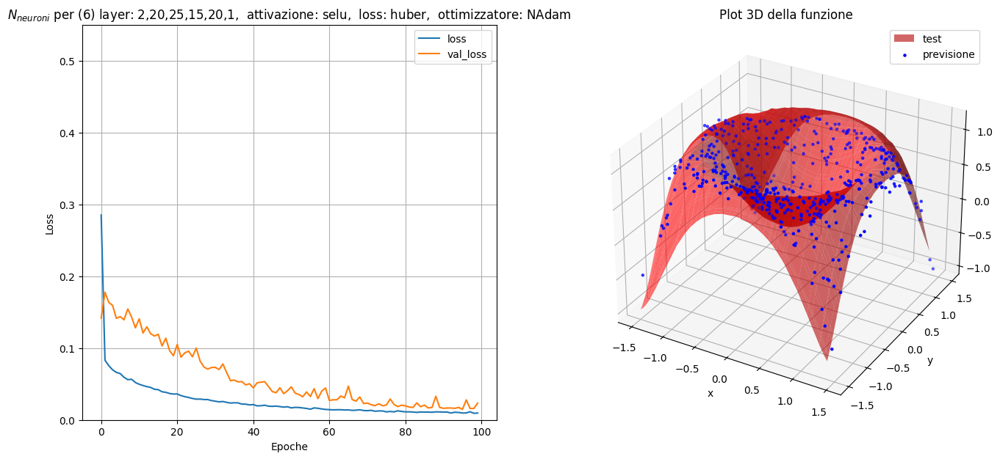

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


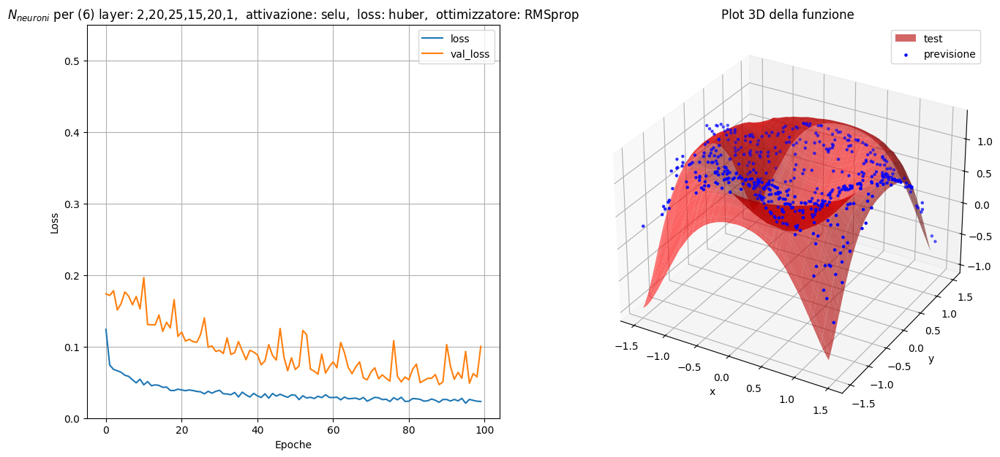

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


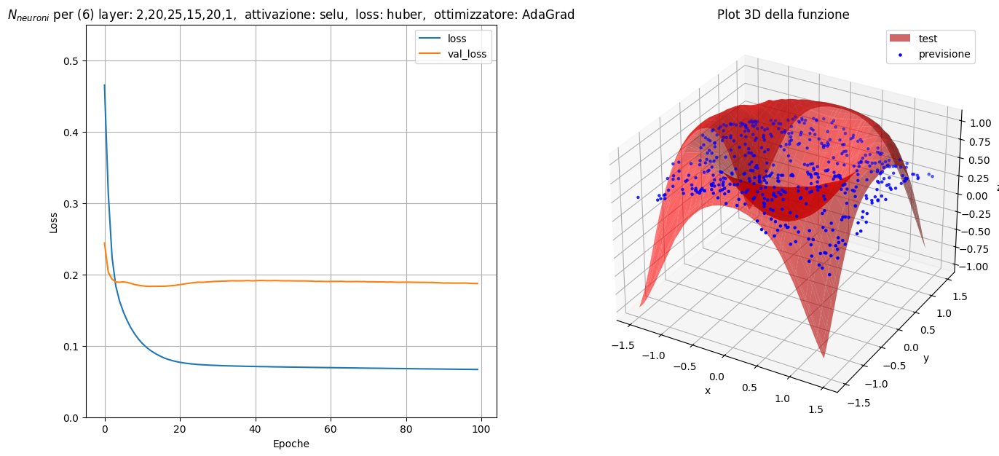

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


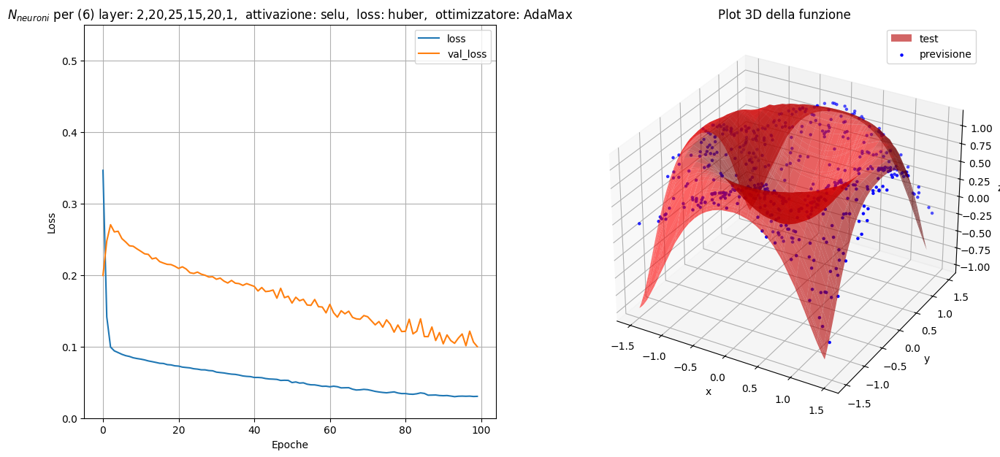

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


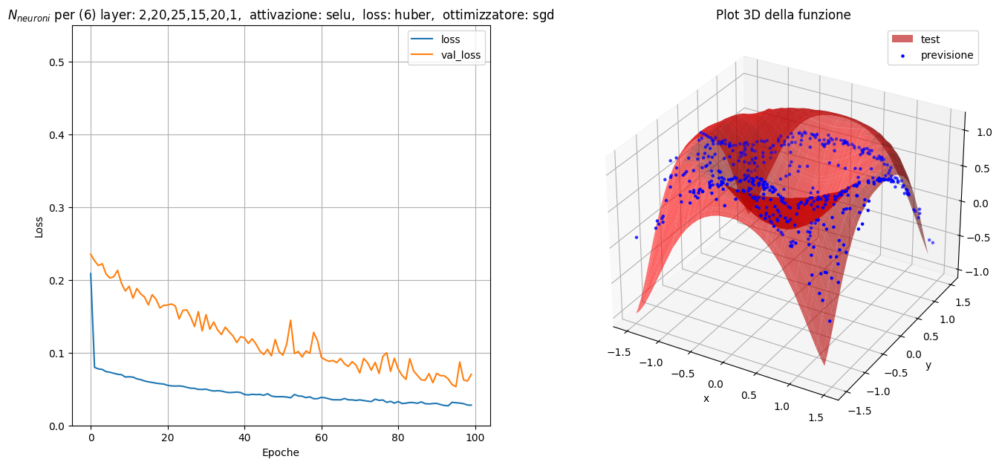

Cambio funzione Loss
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


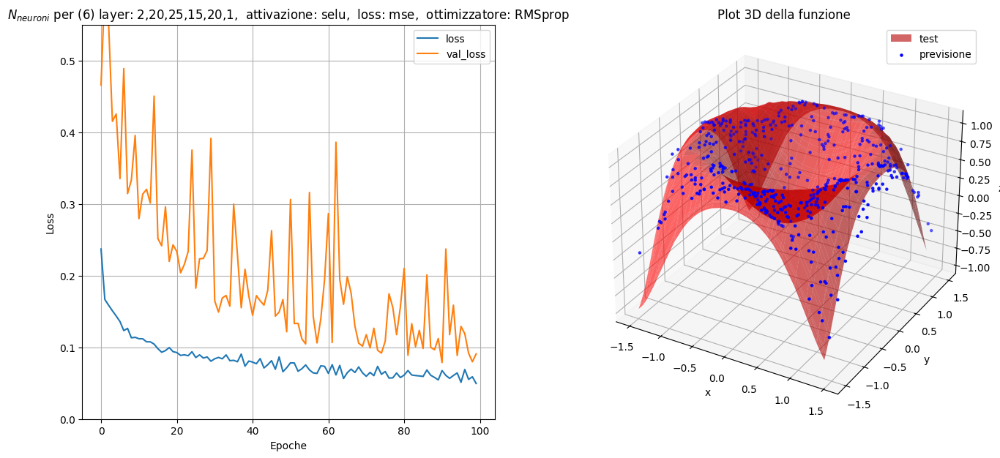

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


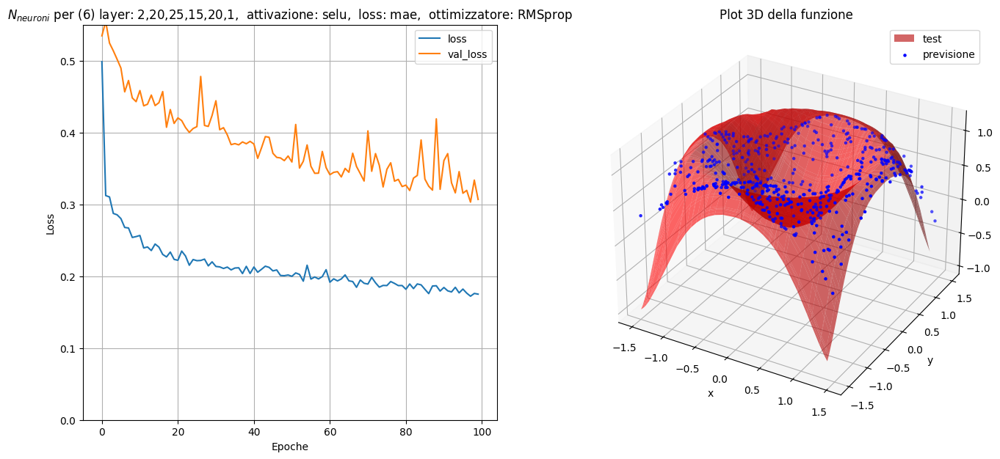

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


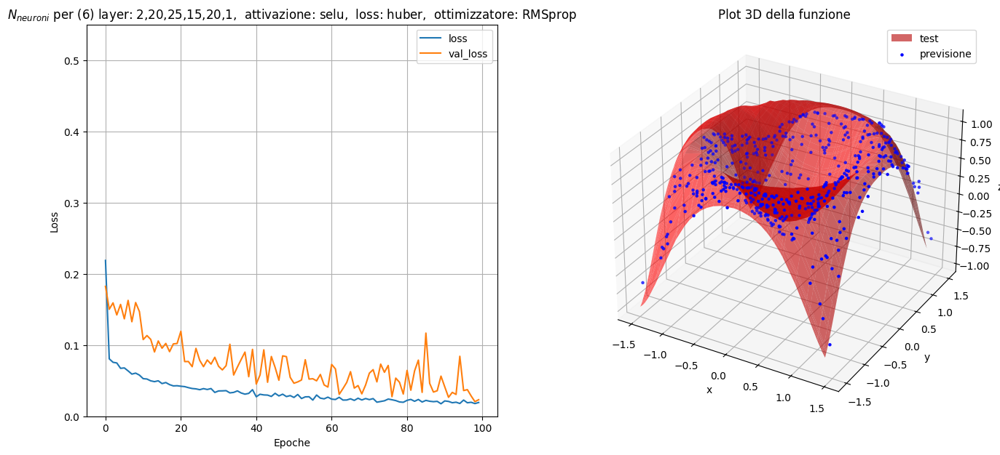

Cambio funzione di attivazione
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


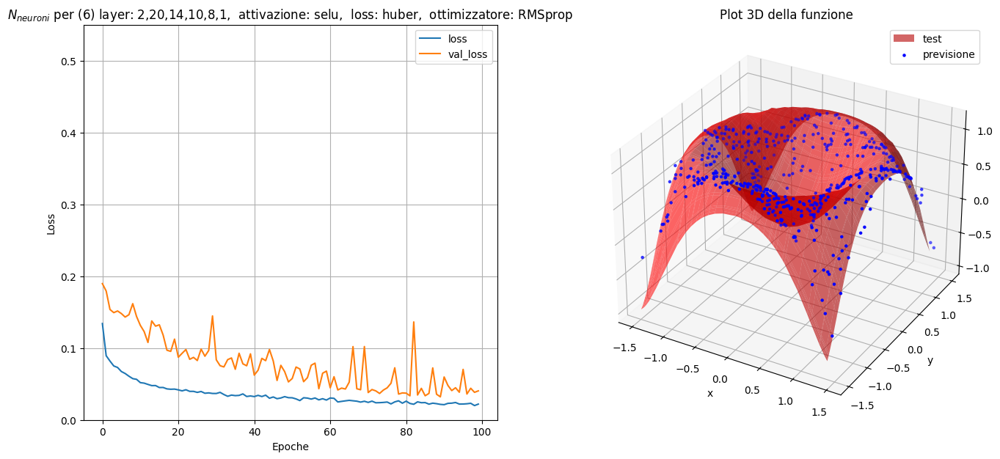

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


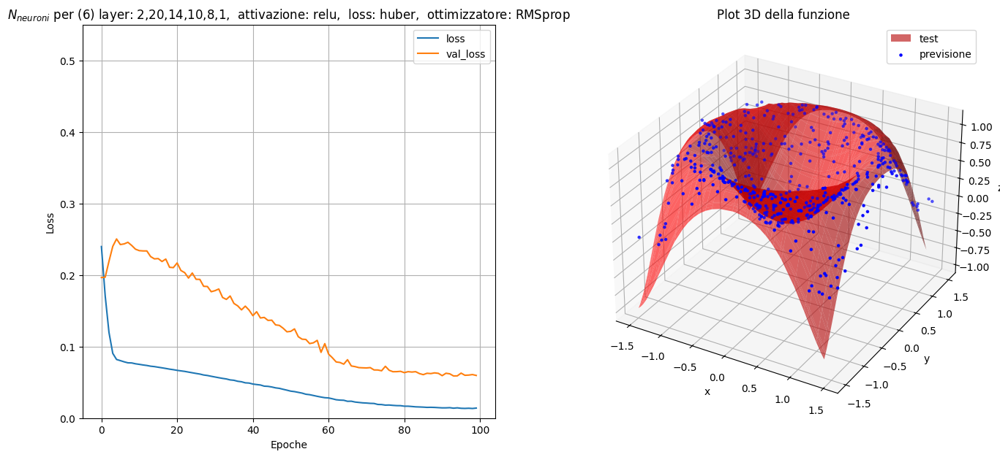

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


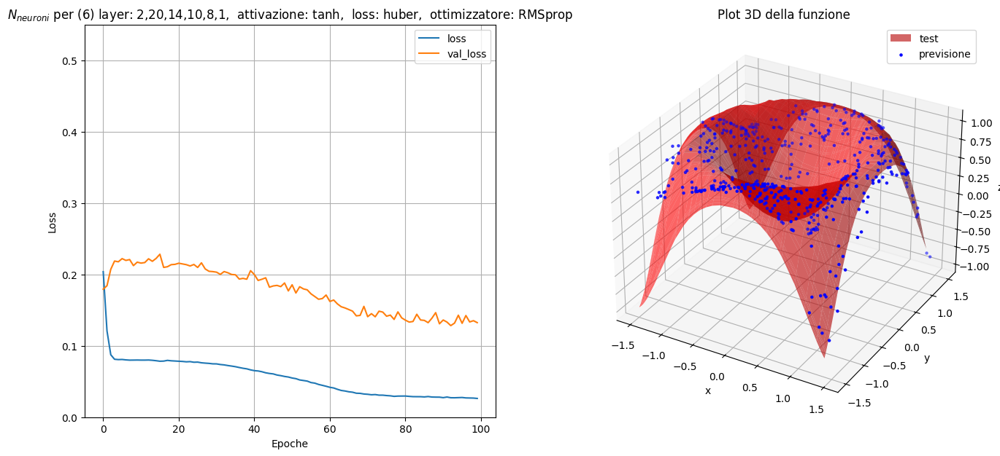

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


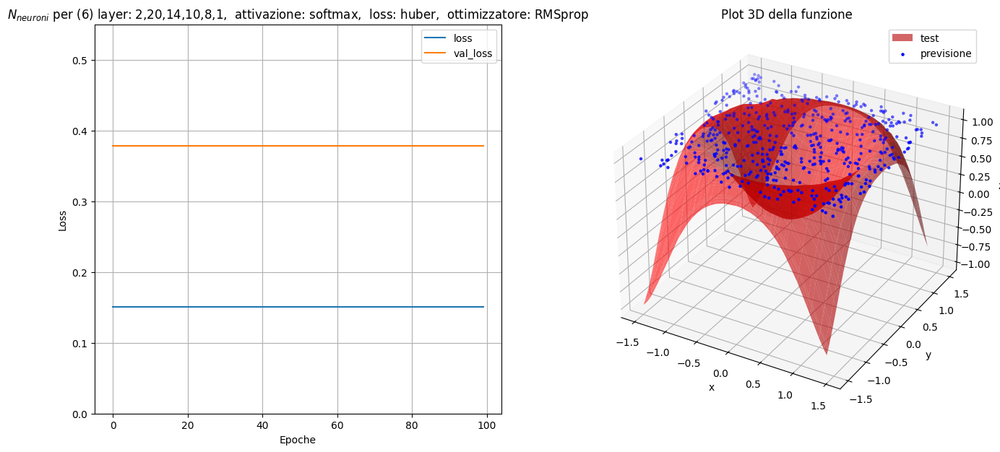

Cambio ottimizzatore
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


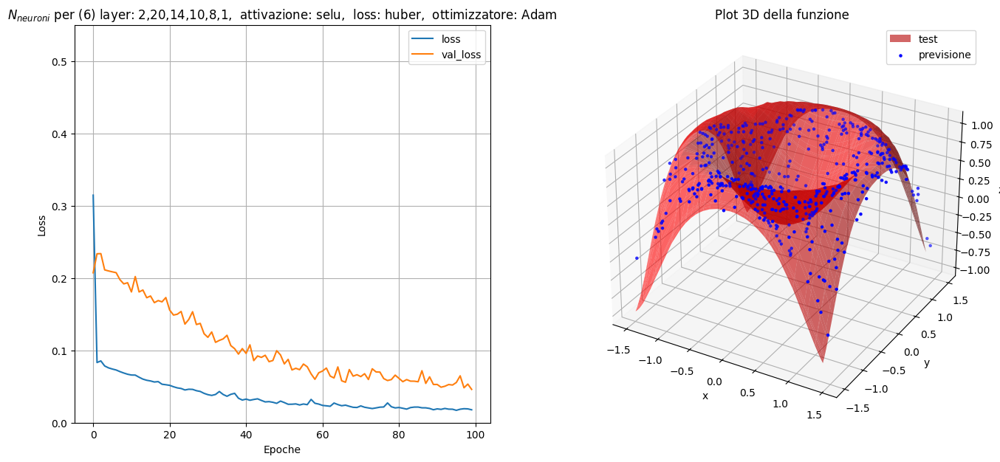

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


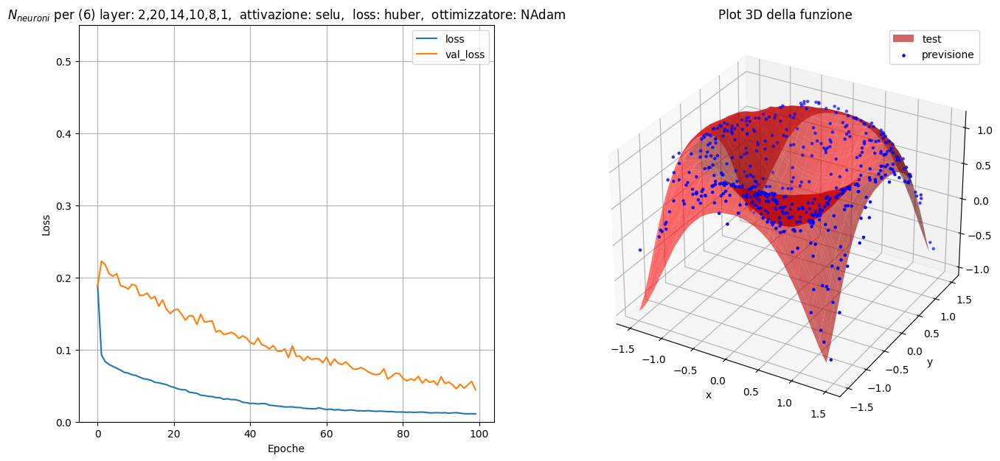

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


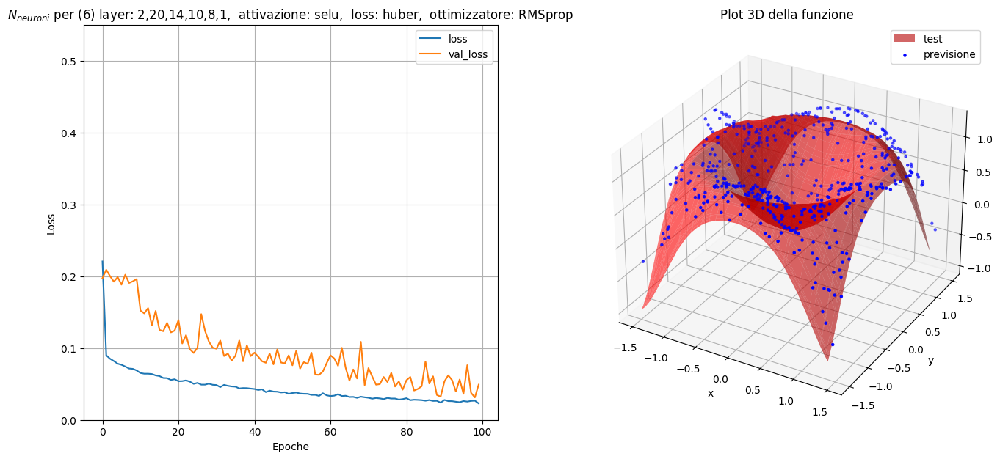

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


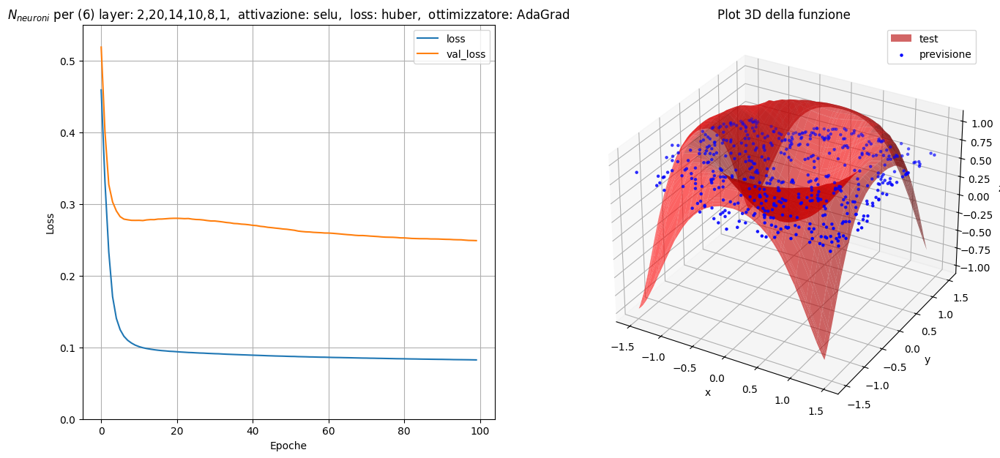

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


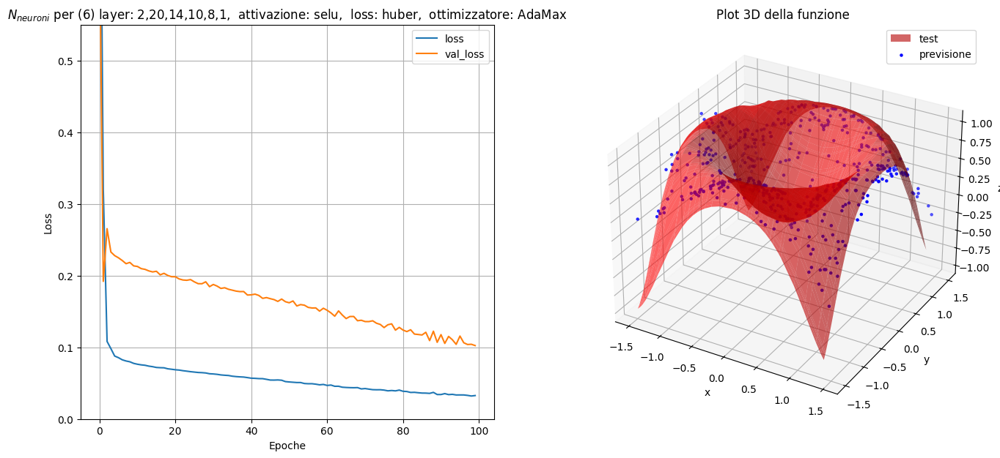

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


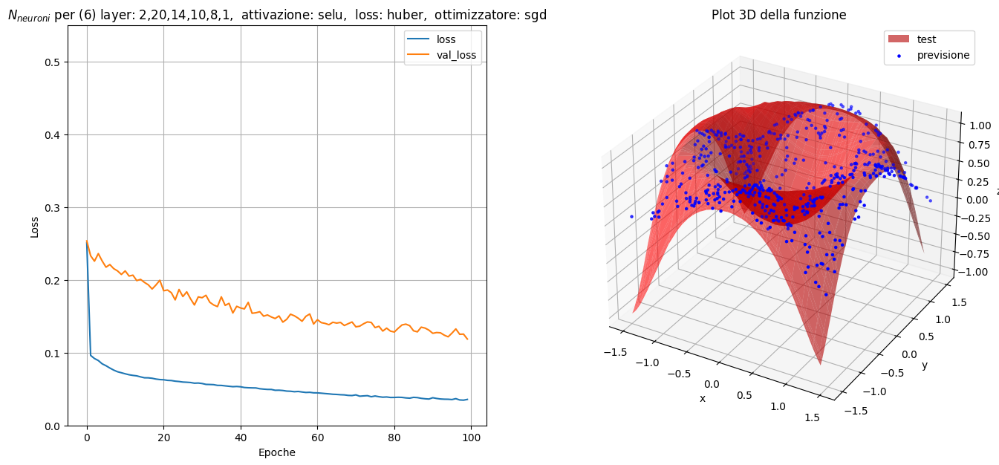

Cambio funzione Loss
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


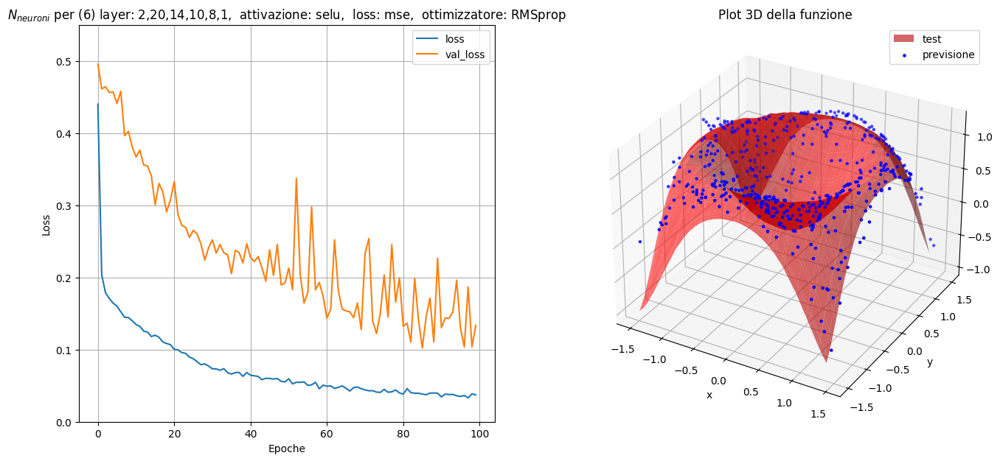

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


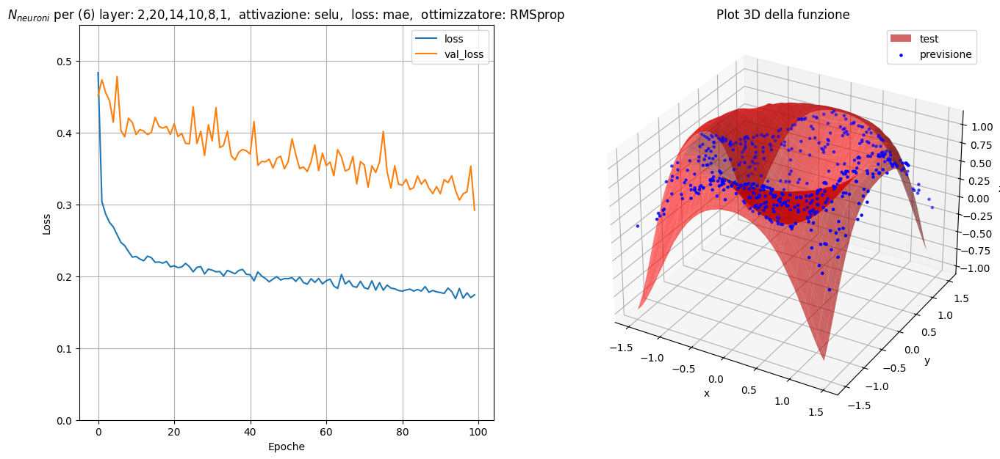

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


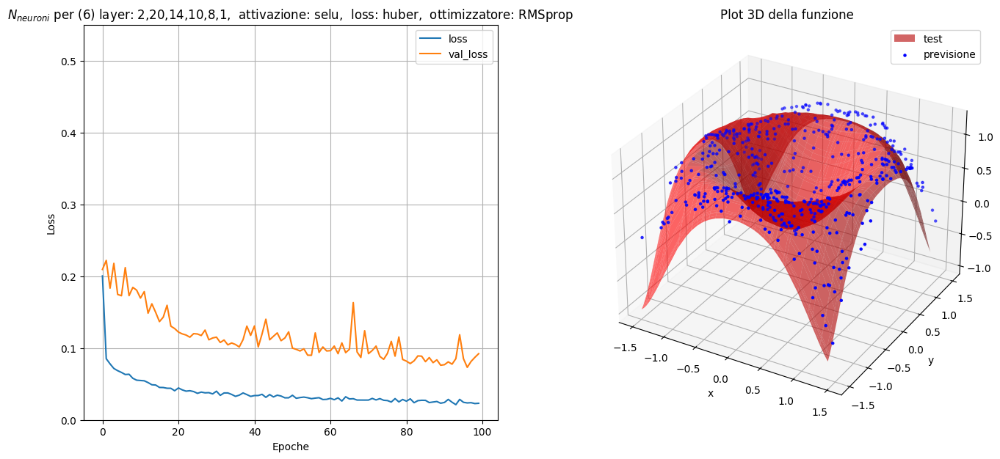

In [11]:
# variabili locali dei modelli che sovrascrivo ogni volta che devo modificarle
# cambio le funzioni di attivazione
act_list = ['selu', 'relu', 'tanh', 'softmax']
opt_list = ['Adam', 'NAdam', 'RMSprop', 'AdaGrad', 'AdaMax', 'sgd']
loss_list = ['mse', 'mae', 'huber']

parameters_2D_1 = {
    "activation": 'selu',   # funzione di attivazione
    "optimizer": 'RMSprop', # ottimizzatore
    "loss_func": 'mse',     # funzione perdita
    "metric": 'mse',        # metrica
    "epochs": 100,
}

# loss
# mae, huber

for NN in NN_list:
    print("Cambio funzione di attivazione")
    for a in act_list:
        parameters_2D_1['activation'] = a
        create_2Dmodel(neurons_per_layer=NN, param=parameters_2D_1)

    print("Cambio ottimizzatore")
    parameters_2D_1['activation'] = 'selu'
    for o in opt_list:
        parameters_2D_1['optimizer'] = o
        create_2Dmodel(neurons_per_layer=NN, param=parameters_2D_1)
    
    print("Cambio funzione Loss")
    parameters_2D_1['optimizer'] = 'RMSprop'
    
    for l in loss_list:
        parameters_2D_1['loss_func'] = l
        create_2Dmodel(neurons_per_layer=NN, param=parameters_2D_1)
    parameters_2D_1['loss_func'] = 'huber'
    


### Conclusioni
Da tutti i test svolti è emerso che la configurazione di rete neurale più efficiente è stata ottenuta con:

- Sequenza Neuroni / layer = [2,20,25,15,20,1]
- Epoche: 100
- Funzione di attivazione "selu"
- Funzione Loss "huber"
- Ottimizzatore "NAdam"